# Exploratory Training Data Analysis
- Identifying features > 25% missing to remove
- Identifying extremely correlating features to remove
- Plotting distributions of features
- Plotting selected features by BorutaShap (correlation, covariance, distribution, mutual information, pairwise plots)
- Pairwise-dependence plots of selected features by BorutaShap and their feature-feature interactions.
- Visualization of unsupervised learning (training data groupings in hierarchical clustering and silhoutte plots)

In [1]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.io as pio
from pdpbox import get_dataset, info_plots, pdp

%matplotlib inline
%config InlineBackend.figure_format ='retina'

pio.renderers.default = "notebook"
import plotly.figure_factory as ff
import plotly.offline as py

import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

py.init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import missingno as msno
import numpy
import plotly.graph_objs as go
import plotly.tools as tls
import scipy.cluster.hierarchy as hcluster
import scipy.cluster.hierarchy as shc
from missingpy import MissForest
#from plotnine import *
from scipy.cluster.hierarchy import dendrogram, ward
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use("ggplot")
import seaborn as sns
from plotnine import*

from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.model_selection import train_test_split

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 300

import re

from scipy.cluster.hierarchy import dendrogram, linkage

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import gc
import warnings

warnings.filterwarnings("ignore")

import xgboost
from sklearn.model_selection import train_test_split

seed = 0

In [2]:
dataset = pd.read_csv("3l_training_data.txt", sep="\t")
dataset = dataset.rename({'IPA_BP':'IPA_BP_annotation'}, axis=1)
dataset.shape

(293, 119)

In [3]:
data = dataset.drop(
    ["Gene","minP.min.max", "minP.min.min"], 1, errors='ignore'
) 
print(data.shape)

(293, 118)


In [4]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 2, "least likely": 3}
)
Y = data["BPlabel_encoded"]

In [5]:
data.describe()

,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,Adrenal Gland_GTExTPM,...,M-CAP_rankscore,MetaLR_rankscore,MetaSVM_rankscore,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel_encoded
count,79.000000,71.000000,71.000000,0.0,293.000000,277.000000,202.000000,250.000000,250.000000,250.000000,...,77.000000,77.000000,77.000000,73.000000,77.000000,78.000000,78.000000,188.000000,78.000000,293.000000
mean,0.151481,0.409563,0.161437,NaN,233.358362,0.006667,82.289822,49.424806,44.436780,93.128354,...,0.612456,0.597400,0.598472,0.596676,0.428506,0.787086,0.606648,0.527368,0.603833,2.143345
std,0.138249,0.233443,0.287332,NaN,494.452338,0.423652,278.525886,189.731966,170.059814,587.571596,...,0.296804,0.299196,0.299483,0.302746,0.321888,0.330781,0.297960,0.303226,0.285745,0.687410
min,0.011000,0.043000,0.000000,NaN,1.000000,-0.832600,5.096910,0.000000,0.000000,0.000000,...,0.032450,0.013650,0.008420,0.007490,0.008000,0.002500,0.058000,0.000207,0.009610,1.000000
25%,0.046000,0.289000,0.000000,NaN,31.000000,-0.371900,11.774227,0.123009,0.105408,0.148155,...,0.421660,0.304600,0.387420,0.349340,0.137000,0.768550,0.328008,0.275250,0.410828,2.000000
50%,0.104000,0.402000,0.001000,NaN,74.000000,-0.134500,22.650515,5.033580,5.206535,2.843980,...,0.625170,0.642350,0.632820,0.657030,0.354000,0.955765,0.731370,0.563500,0.671540,2.000000
75%,0.226500,0.477500,0.143000,NaN,244.000000,0.377600,49.091129,26.559550,24.756600,18.748175,...,0.890120,0.868700,0.855770,0.889720,0.735000,0.988328,0.867870,0.782250,0.839352,3.000000
max,0.657000,0.958000,0.953000,NaN,6437.000000,1.255900,3228.698970,2239.420000,1987.060000,6921.500000,...,0.996500,0.999930,0.999910,0.996390,0.978000,0.998400,0.996250,1.000000,0.993020,3.000000


### Plotting Data Missingness:

<AxesSubplot:>

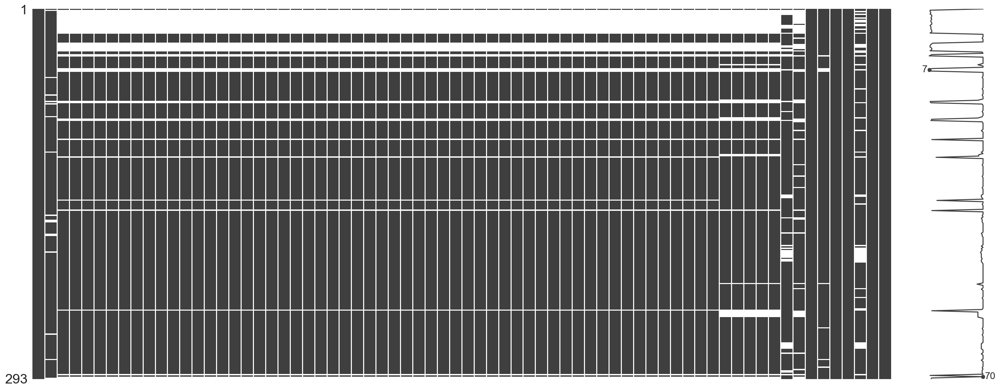

In [6]:
sorted_data = msno.nullity_filter(data, filter='top', n=70, p=0.75)
msno.matrix(sorted_data)


In [7]:
data.isnull().sum()

REVEL.max                         214
MetaSVM_rankscore.max             222
MetaLR_rankscore.max              222
MCAP.max                          293
wgEncodeBroadHmmHuvecHMM.count      0
                                 ... 
integrated_fitCons_rankscore      215
LoFtool                           105
GERP_Rankscore                    215
BPlabel                             0
BPlabel_encoded                     0
Length: 119, dtype: int64

In [8]:
natest = data.isnull().sum()
natest.sort_values(inplace=True)
# natest.to_csv('traininggenes_features_with_NA.csv')

In [9]:
percent_missing = data.isnull().sum() * 100 / len(data)
missing_value_df = pd.DataFrame(
    {"column_name": data.columns, "percent_missing": percent_missing}
)
missing_value_df.sort_values("percent_missing", inplace=True)

In [10]:
natest = natest.to_frame()
missingdata = natest.join(missing_value_df)

In [11]:
missingdata.to_csv("traininggenes_features_with_NA.csv")

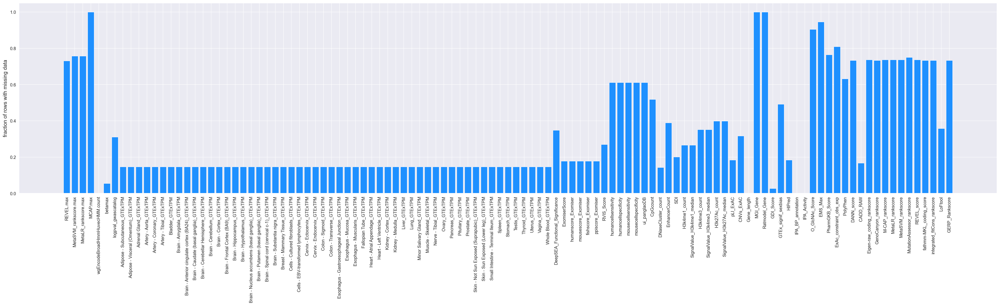

In [12]:
data = data.drop(
    ["BPlabel", "BPlabel_encoded", "BPmed", "SideeffectFreq", "Sideeffectseverity", "Others", "Mechanism", "Rank"], 1, errors='ignore'
) 
null_counts = data.isnull().sum() / len(data)

plt.figure(figsize=(40, 8))
plt.xticks(np.arange(len(null_counts)) + 0.0, null_counts.index, rotation="vertical")
plt.ylabel("fraction of rows with missing data")
plt.bar(np.arange(len(null_counts)), null_counts, color="dodgerblue")

plt.savefig('feature_missingness.png', format='png', dpi=300, bbox_inches = "tight")

In [13]:
selection = missing_value_df[missing_value_df["percent_missing"] < 25.00]
list(selection["column_name"])

['BPlabel_encoded',
 'Gene_length',
 'wgEncodeBroadHmmHuvecHMM.count',
 'BPlabel',
 'IPA_BP_annotation',
 'IPA_Activity',
 'GDI_Score',
 'betamax',
 'DNaseCluster_count',
 'Fallopian Tube_GTExTPM',
 'Nerve - Tibial_GTExTPM',
 'Heart - Atrial Appendage_GTExTPM',
 'Heart - Left Ventricle_GTExTPM',
 'Kidney - Cortex_GTExTPM',
 'Kidney - Medulla_GTExTPM',
 'Liver_GTExTPM',
 'Lung_GTExTPM',
 'Minor Salivary Gland_GTExTPM',
 'Muscle - Skeletal_GTExTPM',
 'Ovary_GTExTPM',
 'Skin - Sun Exposed (Lower leg)_GTExTPM',
 'Pituitary_GTExTPM',
 'Prostate_GTExTPM',
 'Skin - Not Sun Exposed (Suprapubic)_GTExTPM',
 'Esophagus - Muscularis_GTExTPM',
 'Small Intestine - Terminal Ileum_GTExTPM',
 'Spleen_GTExTPM',
 'Stomach_GTExTPM',
 'Testis_GTExTPM',
 'Thyroid_GTExTPM',
 'Uterus_GTExTPM',
 'Whole Blood_GTExTPM',
 'Pancreas_GTExTPM',
 'Esophagus - Mucosa_GTExTPM',
 'Vagina_GTExTPM',
 'Colon - Transverse_GTExTPM',
 'Adipose - Subcutaneous_GTExTPM',
 'Esophagus - Gastroesophageal Junction_GTExTPM',
 'Adrena

In [14]:
data = dataset.drop(
    ["Gene","minP.min.max", "minP.min.min"], 1, errors='ignore'
) 

data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 2, "least likely": 3}
)
Y = data["BPlabel_encoded"]
dat = data[list(selection["column_name"])]
dat["Gene"] = dataset["Gene"]

In [15]:
dt2 = dat
dat = dat.set_index("Gene")

## Feature Correlation:

In [16]:
df = dt2
df = df.set_index("Gene")
df["BPlabel_encoded"] = df["BPlabel"].map(
    {"most likely": 1, "probable": 2, "least likely": 3}
)

# removing remaining variant-level features strongly correlating with gene length:
df = df.drop(
    [
        "BPlabel",
        "Gene_length",
        "CADD_RAW",
        "gwastrait",
        "ppiscore_Exomiser",
        "DNaseCluster_count",
        "H3k4me1_count",
        "CpGcount",
        "EnhancerCount",
        "H3k4me3_count",
        "H3k27Ac_count",
    ],
    1,
    errors="ignore",
)
df.shape

(293, 67)

In [17]:
X = MinMaxScaler().fit_transform(df)
imputer = MissForest(random_state=seed)
X = pd.DataFrame(imputer.fit_transform(X), index=df.index, columns=df.columns)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7


BPlabel_encoded               1.000000
Testis_GTExTPM                0.097450
Esophagus - Mucosa_GTExTPM    0.041575
GDI_Score                     0.032972
Stomach_GTExTPM               0.008742
                                ...   
IPA_BP_annotation            -0.452689
mousescore_Exomiser          -0.454316
ExomiserScore                -0.540448
HIPred                       -0.551987
fishscore_Exomiser                 NaN
Name: BPlabel_encoded, Length: 67, dtype: float64


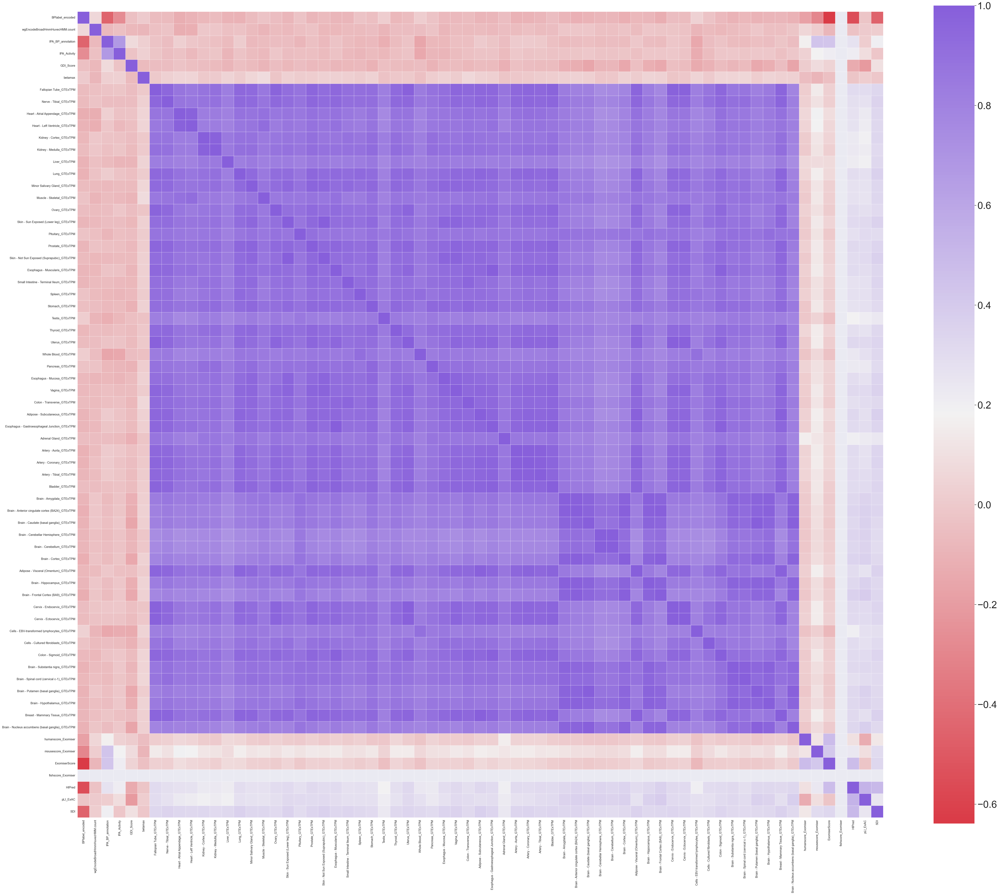

In [18]:
Xcor = X

Xcor = pd.DataFrame(data=Xcor, columns=X.columns)

corr = Xcor.corr(method="spearman")

f, ax = plt.subplots(figsize=(60, 50))

cmap = sns.diverging_palette(10, 275, as_cmap=True)
sns.set(font_scale=3)

sns.heatmap(
    corr,
    cmap=cmap,
    square=True,
    xticklabels=True,
    yticklabels=True,
    linewidths=0.5,
    ax=ax,
)

corr_matrix = X.corr()
print(corr_matrix["BPlabel_encoded"].sort_values(ascending=False))
corr = corr_matrix["BPlabel_encoded"].sort_values(ascending=False)

In [19]:
corr.to_csv("training_correlation.csv", header=True)

In [20]:
corr = X.corr()
corr.head()

,BPlabel_encoded,wgEncodeBroadHmmHuvecHMM.count,IPA_BP_annotation,IPA_Activity,GDI_Score,betamax,Fallopian Tube_GTExTPM,Nerve - Tibial_GTExTPM,Heart - Atrial Appendage_GTExTPM,Heart - Left Ventricle_GTExTPM,...,Brain - Hypothalamus_GTExTPM,Breast - Mammary Tissue_GTExTPM,Brain - Nucleus accumbens (basal ganglia)_GTExTPM,humanscore_Exomiser,mousescore_Exomiser,ExomiserScore,fishscore_Exomiser,HIPred,pLI_ExAC,SDI
BPlabel_encoded,1.000000,-0.012746,-0.452689,-0.244499,0.032972,-0.008181,-0.031493,-0.046953,-0.096868,-0.001579,...,-0.107800,-0.062116,-0.123183,-0.188393,-0.454316,-0.540448,NaN,-0.551987,-0.183159,-0.355017
wgEncodeBroadHmmHuvecHMM.count,-0.012746,1.000000,-0.057963,-0.029179,0.120198,0.027016,-0.029438,0.011456,-0.036001,-0.025765,...,0.040373,-0.035757,0.010481,0.026692,-0.068333,-0.015685,NaN,-0.052661,0.055989,0.075915
IPA_BP_annotation,-0.452689,-0.057963,1.000000,0.630778,0.011662,0.030332,0.081758,0.042790,0.115166,-0.038541,...,0.078000,0.047453,0.074699,0.165629,0.557130,0.378613,NaN,0.276485,0.061694,0.175641
IPA_Activity,-0.244499,-0.029179,0.630778,1.000000,0.014122,0.035385,0.090044,0.039409,-0.013283,-0.030260,...,0.155980,0.039822,0.096453,0.050757,0.192550,0.152050,NaN,0.188305,0.096706,-0.017267
GDI_Score,0.032972,0.120198,0.011662,0.014122,1.000000,-0.032523,0.153406,0.239785,0.042232,0.022363,...,0.105799,0.313210,0.050341,0.032386,-0.009862,-0.013189,NaN,-0.131559,-0.032348,0.109681


In [21]:
print(corr.loc[["BPlabel_encoded"]])

                 BPlabel_encoded  wgEncodeBroadHmmHuvecHMM.count  \
BPlabel_encoded              1.0                       -0.012746   

                 IPA_BP_annotation  IPA_Activity  GDI_Score   betamax  \
BPlabel_encoded          -0.452689     -0.244499   0.032972 -0.008181   

                 Fallopian Tube_GTExTPM  Nerve - Tibial_GTExTPM  \
BPlabel_encoded               -0.031493               -0.046953   

                 Heart - Atrial Appendage_GTExTPM  \
BPlabel_encoded                         -0.096868   

                 Heart - Left Ventricle_GTExTPM  ...  \
BPlabel_encoded                       -0.001579  ...   

                 Brain - Hypothalamus_GTExTPM  \
BPlabel_encoded                       -0.1078   

                 Breast - Mammary Tissue_GTExTPM  \
BPlabel_encoded                        -0.062116   

                 Brain - Nucleus accumbens (basal ganglia)_GTExTPM  \
BPlabel_encoded                                          -0.123183   

                

In [22]:
Xcor = X
Xcor = pd.DataFrame(data=Xcor, columns=X.columns)
corr = Xcor.corr(method="spearman").abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print("Dropped features with > 0.9 correlation:", to_drop)
len(to_drop)

Dropped features with > 0.9 correlation: ['Nerve - Tibial_GTExTPM', 'Heart - Left Ventricle_GTExTPM', 'Kidney - Medulla_GTExTPM', 'Lung_GTExTPM', 'Minor Salivary Gland_GTExTPM', 'Muscle - Skeletal_GTExTPM', 'Ovary_GTExTPM', 'Skin - Sun Exposed (Lower leg)_GTExTPM', 'Prostate_GTExTPM', 'Skin - Not Sun Exposed (Suprapubic)_GTExTPM', 'Esophagus - Muscularis_GTExTPM', 'Small Intestine - Terminal Ileum_GTExTPM', 'Spleen_GTExTPM', 'Stomach_GTExTPM', 'Thyroid_GTExTPM', 'Uterus_GTExTPM', 'Whole Blood_GTExTPM', 'Pancreas_GTExTPM', 'Esophagus - Mucosa_GTExTPM', 'Vagina_GTExTPM', 'Colon - Transverse_GTExTPM', 'Adipose - Subcutaneous_GTExTPM', 'Esophagus - Gastroesophageal Junction_GTExTPM', 'Artery - Aorta_GTExTPM', 'Artery - Coronary_GTExTPM', 'Artery - Tibial_GTExTPM', 'Bladder_GTExTPM', 'Brain - Anterior cingulate cortex (BA24)_GTExTPM', 'Brain - Caudate (basal ganglia)_GTExTPM', 'Brain - Cerebellar Hemisphere_GTExTPM', 'Brain - Cerebellum_GTExTPM', 'Brain - Cortex_GTExTPM', 'Adipose - Viscera

46

In [23]:
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i + 1, corr.shape[0]):
        if corr.iloc[i, j] >= 0.9:
            #print(columns[j])
            if columns[j]:
                columns[j] = False

In [24]:
selected_columns = X.columns[columns]
selected_columns.shape

(21,)

### Features cleaned to enter BorutaShap feature selection:

In [25]:
list(selected_columns)

['BPlabel_encoded',
 'wgEncodeBroadHmmHuvecHMM.count',
 'IPA_BP_annotation',
 'IPA_Activity',
 'GDI_Score',
 'betamax',
 'Fallopian Tube_GTExTPM',
 'Heart - Atrial Appendage_GTExTPM',
 'Kidney - Cortex_GTExTPM',
 'Liver_GTExTPM',
 'Pituitary_GTExTPM',
 'Testis_GTExTPM',
 'Adrenal Gland_GTExTPM',
 'Brain - Amygdala_GTExTPM',
 'humanscore_Exomiser',
 'mousescore_Exomiser',
 'ExomiserScore',
 'fishscore_Exomiser',
 'HIPred',
 'pLI_ExAC',
 'SDI']

In [26]:
dt_towrite = data[list(selected_columns)]
dt_towrite["Gene"] = dataset["Gene"]
dt_towrite["BPlabel"] = dataset["BPlabel"]
dt_towrite = dt_towrite.drop(["BPlabel_encoded"], 1)

### Viewing genes >25% missing rowwise for selected features (after running BorutaShap)

In [27]:
dt = dt2[
    [
       'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]

In [28]:
dt["missing_count"] = dt.isnull().sum(axis=1)  # dt.apply(lambda x: x.count(), axis=1)

dt["missing_percentage"] = (dt["missing_count"] / 19) * 100

dt.sort_values("missing_percentage", inplace=True)
print(dt[["missing_count", "missing_percentage"]])
# dt.shape

     missing_count  missing_percentage
0                0            0.000000
178              0            0.000000
179              0            0.000000
180              0            0.000000
181              0            0.000000
..             ...                 ...
18               6           31.578947
291              6           31.578947
74               6           31.578947
159              6           31.578947
292              6           31.578947

[293 rows x 2 columns]


In [29]:
dtmissing = dt.loc[dt["missing_percentage"] > 25]
dtmissing

,HIPred,Heart - Atrial Appendage_GTExTPM,Pituitary_GTExTPM,mousescore_Exomiser,SDI,pLI_ExAC,missing_count,missing_percentage
87,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
11,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
10,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
9,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
8,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
7,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
6,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
37,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
88,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947
13,NaN,NaN,NaN,NaN,NaN,NaN,6,31.578947


### Gene length distribution:


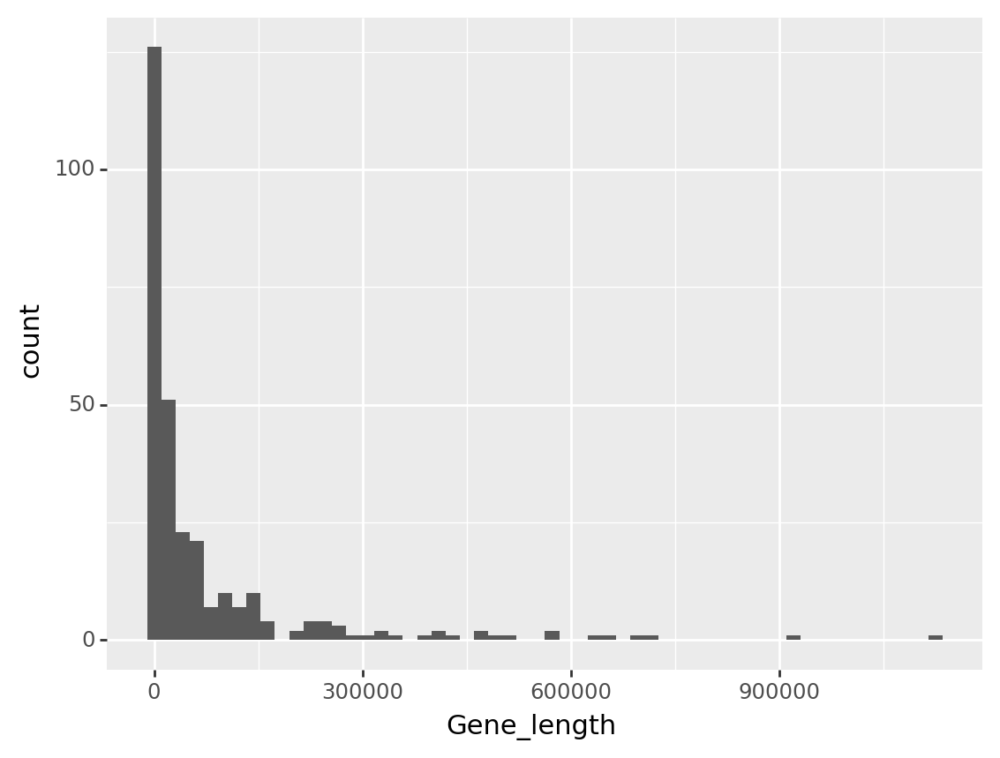

<ggplot: (8763000036271)>

In [32]:
(ggplot(dat, aes(x="Gene_length")) + geom_histogram())

In [37]:
dt_ml = data.loc[data["BPlabel_encoded"] == 1.0]

dt_ml = dt_ml[
    [
        "Gene_length",
        'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]


dt_ll = data.loc[data["BPlabel_encoded"] == 0.1]

dt_ll = dt_ll[
    [
        "Gene_length",
    'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]

target_0 = data.loc[data["BPlabel_encoded"] == 3]
target_1 = data.loc[data["BPlabel_encoded"] == 1]
target_2 = data.loc[data["BPlabel_encoded"] == 2]
combo = pd.concat([target_0, target_1])
combo2 = pd.concat([target_0, target_1, target_2])

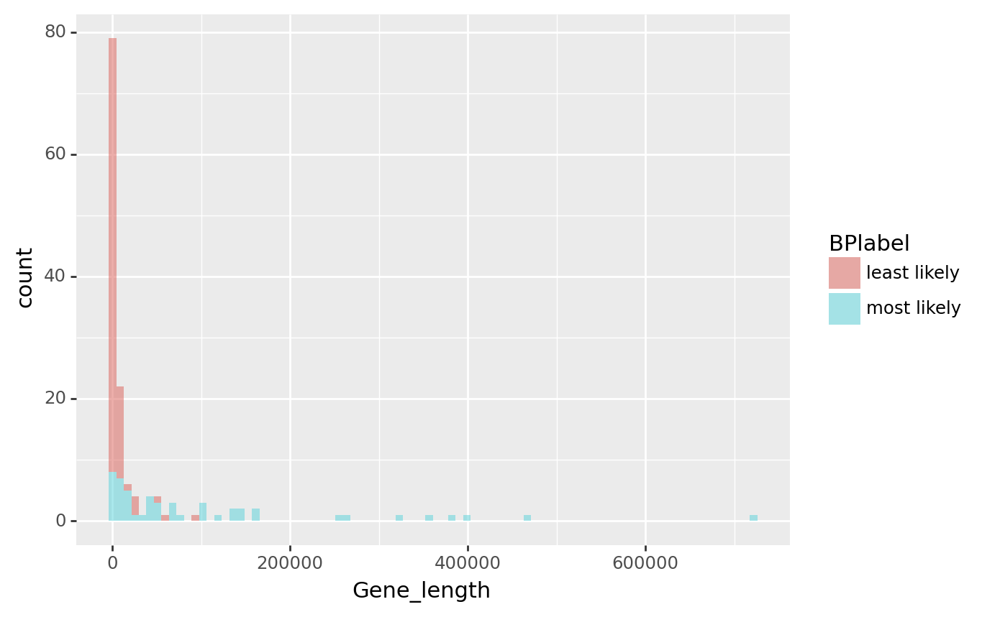

<ggplot: (8762849250027)>

In [38]:
(ggplot(combo, aes(x="Gene_length", fill="BPlabel")) + geom_histogram(alpha=0.5))

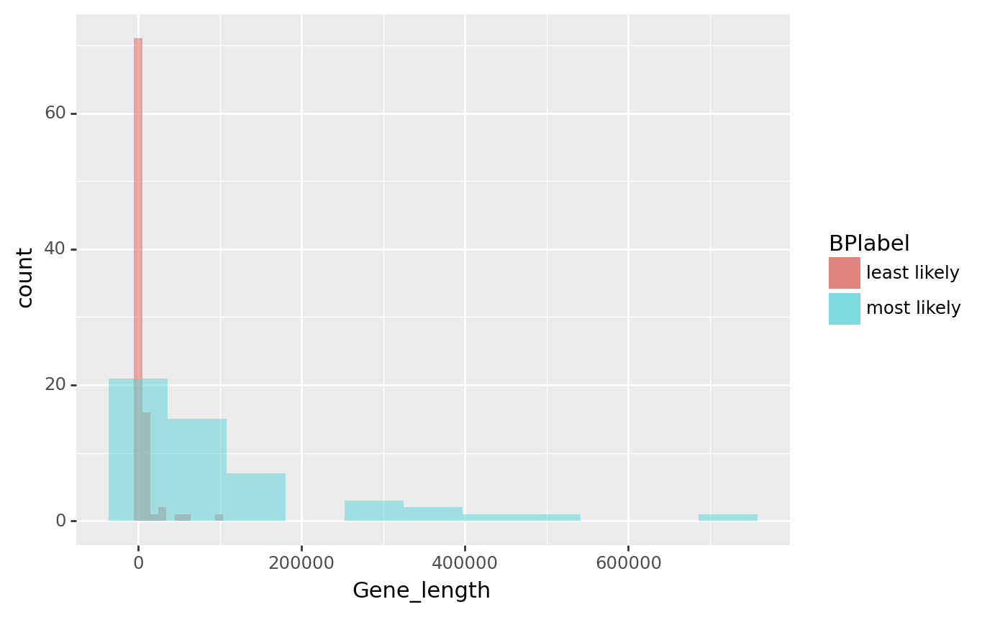

<ggplot: (8762900249284)>

In [39]:
(
    ggplot()
    + geom_histogram(target_0, aes(x="Gene_length", fill="BPlabel"), alpha=0.5)
    + geom_histogram(target_1, aes(x="Gene_length", fill="BPlabel"), alpha=0.5)
)

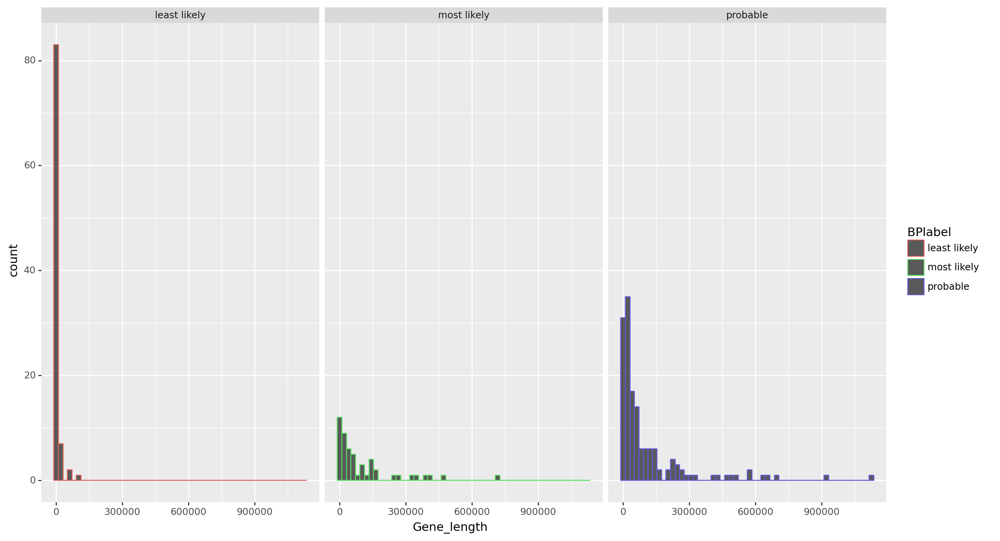

<ggplot: (8762985629937)>

In [41]:
ggplot(combo2, aes(x="Gene_length", color="BPlabel")) + geom_histogram() + facet_wrap(
    ["BPlabel"]
) + theme(figure_size=(14, 8))

### Feature distribution:

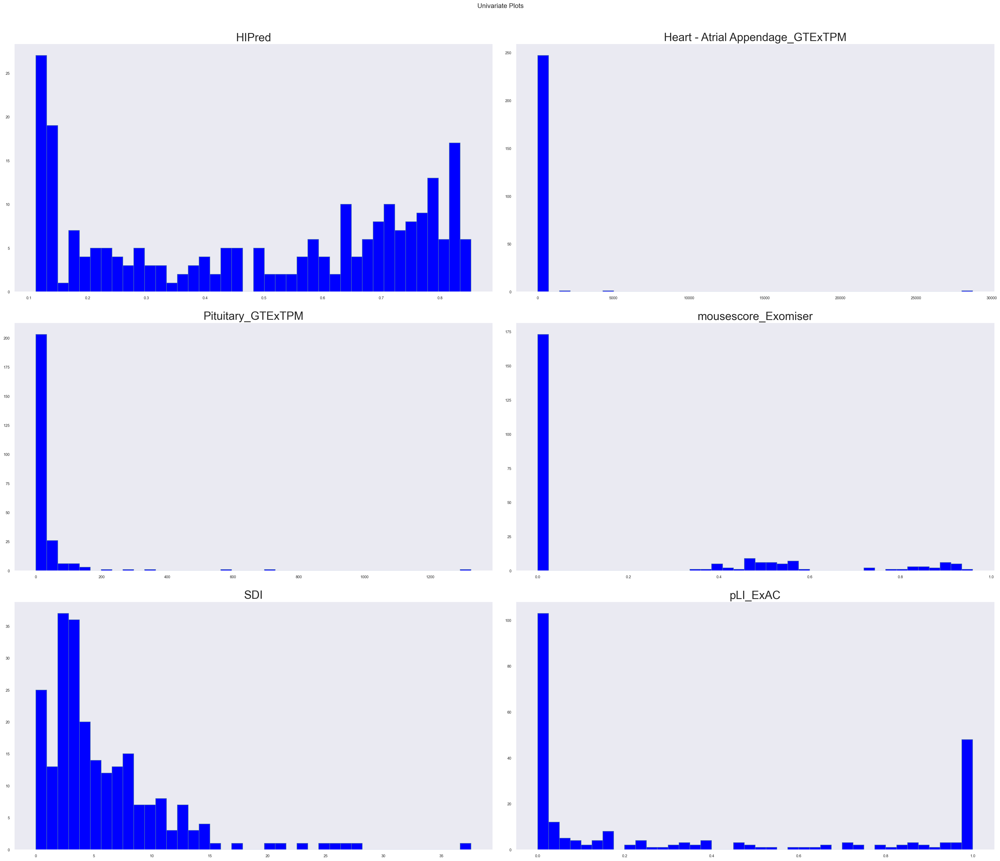

In [42]:
# features only selected by BorutaShap:
sns.set(font_scale=2)
features_list = [
'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'

]

dt[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=8,
    ylabelsize=8,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

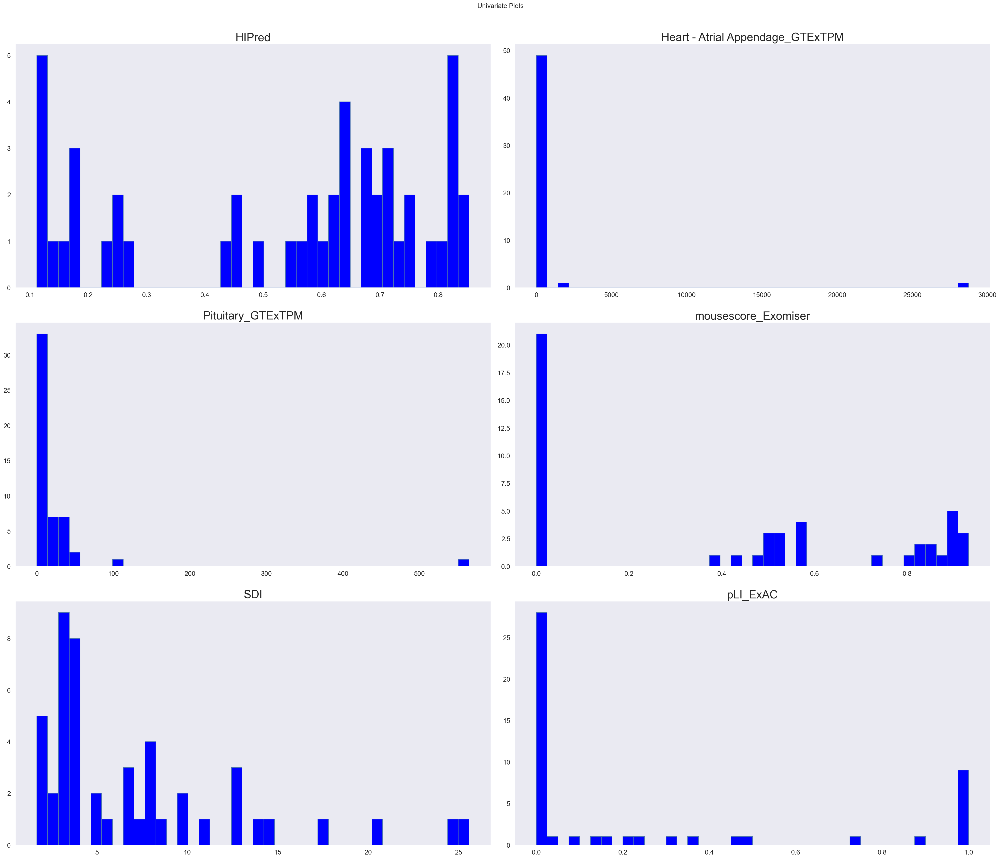

In [43]:
# most likely genes

dt_ml = data.loc[data["BPlabel_encoded"] == 1.0]

dt_ml = dt_ml[
    [
       'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]

sns.set(font_scale=2)
features_list = list(dt_ml.columns)

dt_ml[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

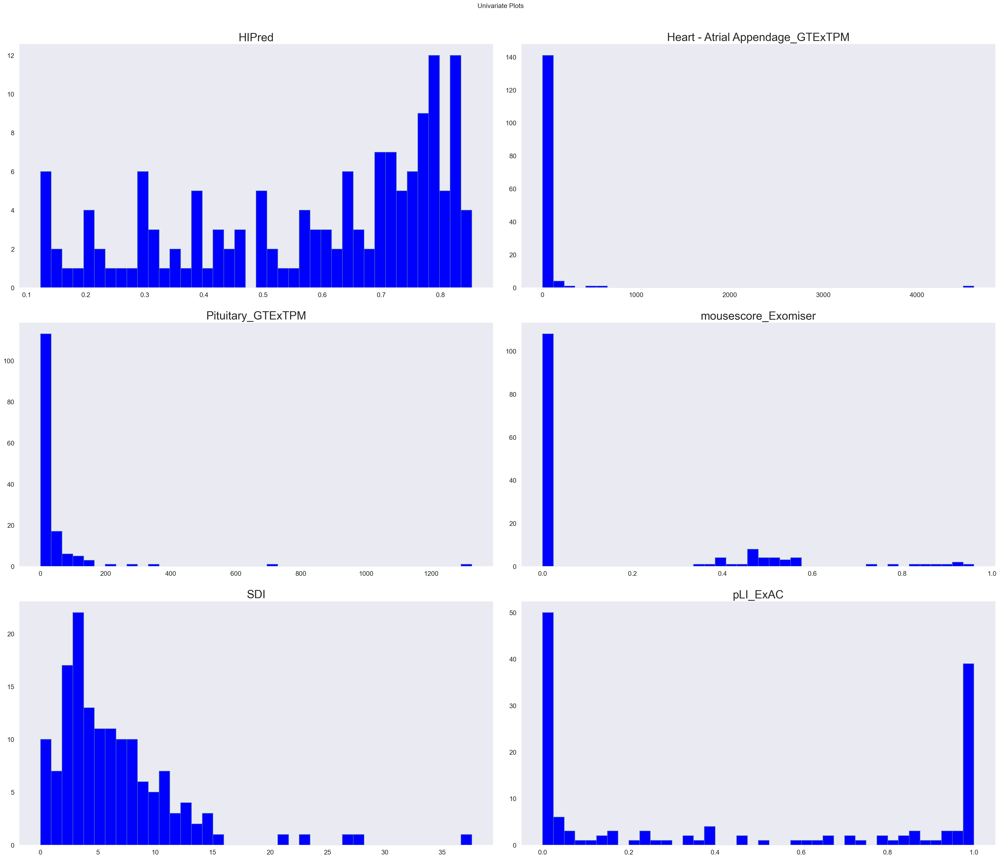

In [44]:
# probable genes

dt_p = data.loc[data["BPlabel_encoded"] == 2]

dt_p = dt_p[
    [
     'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]


sns.set(font_scale=2)
features_list = list(dt_p.columns)

dt_p[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

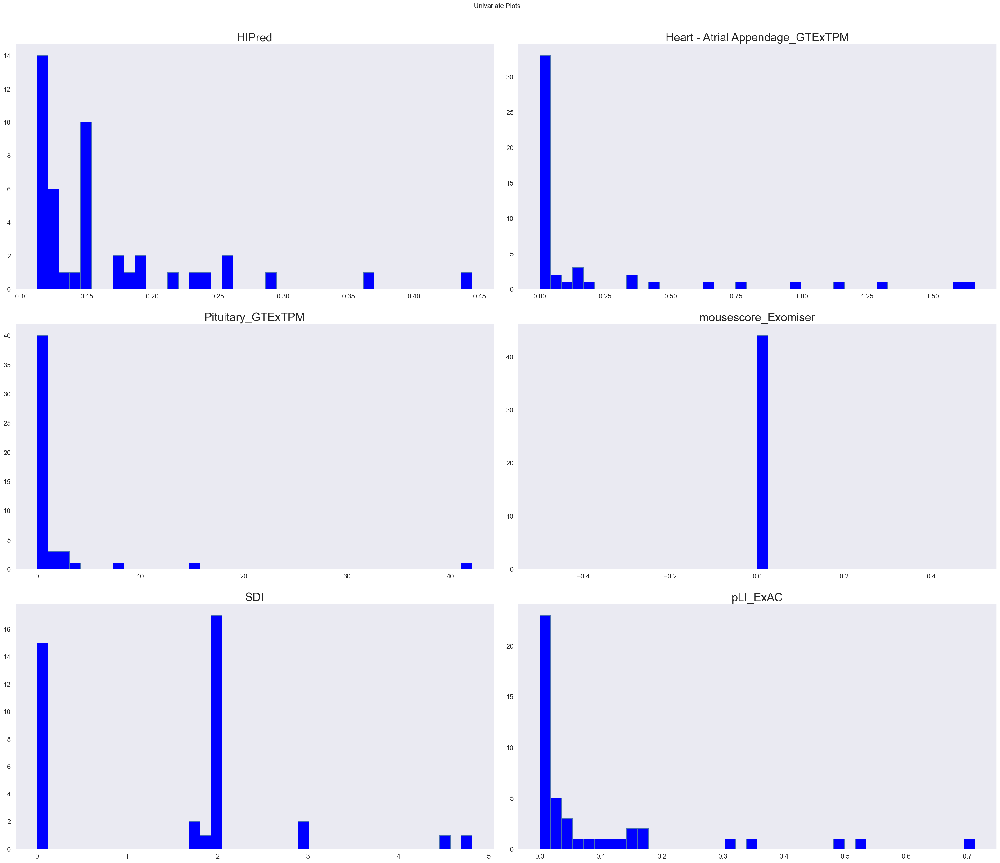

In [45]:
# least likely genes
dt_ll = data.loc[data["BPlabel_encoded"] == 3]

dt_ll = dt_ll[
    [
       'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ]
]

sns.set(font_scale=2)
features_list = list(dt_ll.columns)

dt_ll[features_list].hist(
    bins=40,
    edgecolor="b",
    linewidth=1.0,
    xlabelsize=14,
    ylabelsize=14,
    grid=False,
    figsize=(30, 25),
    color="blue",
)
plt.tight_layout()
ax.set_ylabel("Gene Count")

plt.suptitle("Univariate Plots", y=1.02, fontsize=14);

### Covariation Heatmaps:

Text(0.5, 1.0, 'Covariance between different features')

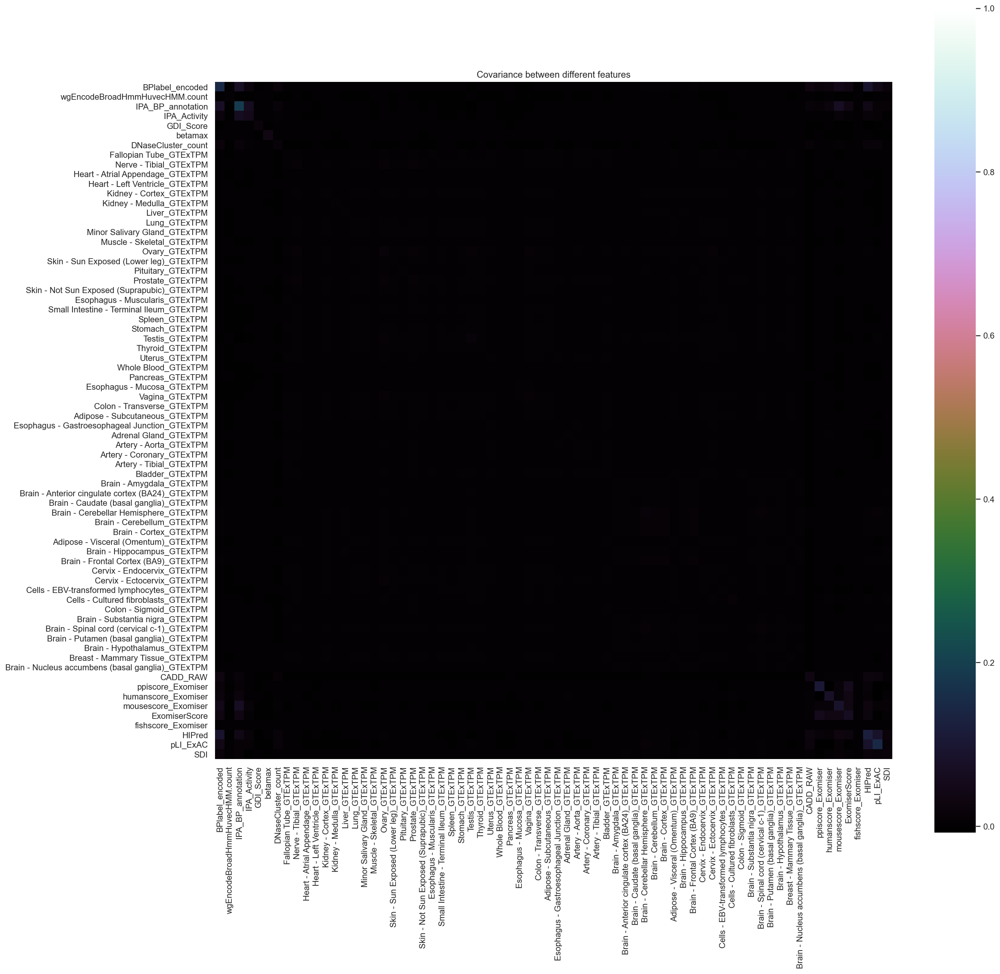

In [46]:
mean_vec = np.mean(Xcor, axis=0)
cov_mat = (Xcor - mean_vec).T.dot((Xcor - mean_vec)) / (Xcor.shape[0] - 1)
# print('Covariance matrix \n%s' %cov_mat)
sns.set(font_scale=1)
plt.figure(figsize=(20, 20))
sns.heatmap(cov_mat, vmax=1, square=True, cmap="cubehelix")

plt.title("Covariance between different features")

## Visualization of Selected Features
Features selected by BorutaShap

In [5]:
X2 = pd.read_csv("imputed_training_data.csv", header=0)
X2 = pd.concat([X2, Y], axis=1)

In [54]:
sns.pairplot(
    X2,
    hue="BPlabel_encoded",
    vars=[
    'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'
    ],
)

## Mutual Information of Selected Features
Mutual information (MI) between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

Feature 0: 0.044935
Feature 1: 0.130778
Feature 2: 0.000000
Feature 3: 0.031944
Feature 4: 0.000000
Feature 5: 0.250387
Feature 6: 0.228839
Feature 7: 0.275144
Feature 8: 0.229079
Feature 9: 0.285583
Feature 10: 0.197598
Feature 11: 0.255388
Feature 12: 0.302372
Feature 13: 0.262561
Feature 14: 0.255647
Feature 15: 0.293912
Feature 16: 0.293577
Feature 17: 0.321088
Feature 18: 0.274025
Feature 19: 0.254493
Feature 20: 0.346021
Feature 21: 0.257560
Feature 22: 0.287208
Feature 23: 0.301317
Feature 24: 0.250678
Feature 25: 0.246840
Feature 26: 0.301940
Feature 27: 0.278048
Feature 28: 0.243989
Feature 29: 0.221880
Feature 30: 0.254507
Feature 31: 0.238761
Feature 32: 0.279623
Feature 33: 0.258037
Feature 34: 0.264126
Feature 35: 0.253160
Feature 36: 0.278638
Feature 37: 0.301849
Feature 38: 0.414152
Feature 39: 0.294931
Feature 40: 0.265774
Feature 41: 0.268500
Feature 42: 0.279153
Feature 43: 0.324058
Feature 44: 0.302219
Feature 45: 0.316348
Feature 46: 0.263775
Feature 47: 0.280011
Fe

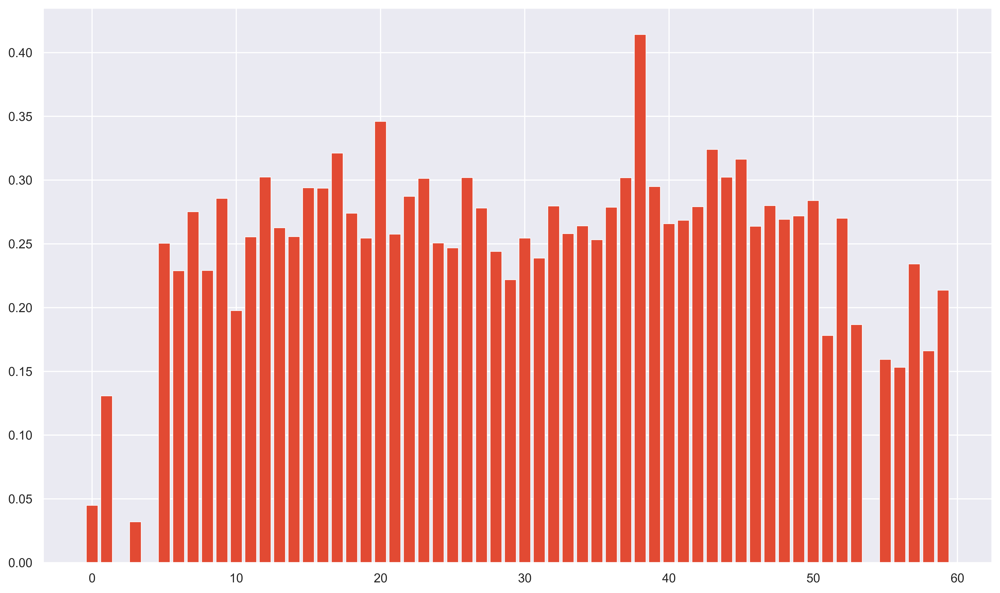

In [57]:
#X2 = X2.drop(["BPlabel_encoded"], 1)

# feature selection
def select_features(X_train, y_train, X_test):
    # configure to select all features
    fs = SelectKBest(score_func=mutual_info_regression, k="all")
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs


# load the dataset
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X2, Y, test_size=0.2, random_state=1
)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
    print("Feature %d: %f" % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [6]:
X2 = X2[['pLI_ExAC','HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser','SDI']]

## Comparison of F-test and mutual information
As F-test captures only linear dependency, it rates x_1 (HIPred) as the most discriminative feature. On the other hand, mutual information can capture any kind of dependency between variables and it rates x_4 (ExomiserScore) as the most discriminative feature, which probably agrees better with our intuitive perception for this example. Both methods mark GTEx tissues (x_5 - x_7) as having the least relevance.

Mutual Information:
It measures the average reduction in uncertainty about x that results from learning the value of y; or vice versa, the average amount of information that x conveys about y — Page 139, Information Theory, Inference, and Learning Algorithms, 2003.


F-Test: calculates F-statistic and does a hypothesis testing model X and Y where X is a model created by just a constant and Y is the model created by a constant and a feature.

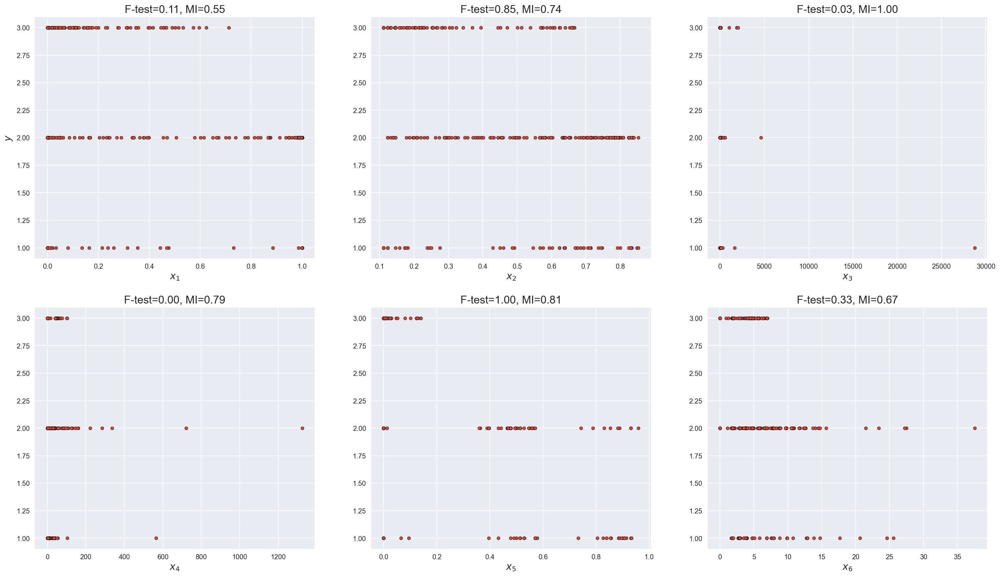

In [7]:
f_test, _ = f_regression(X2, Y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X2, Y)
mi /= np.max(mi)

plt.figure(figsize=(25, 30))
for i in range(6):
    plt.subplot(4, 3, i + 1)
    plt.scatter(X2.iloc[:, i], Y, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

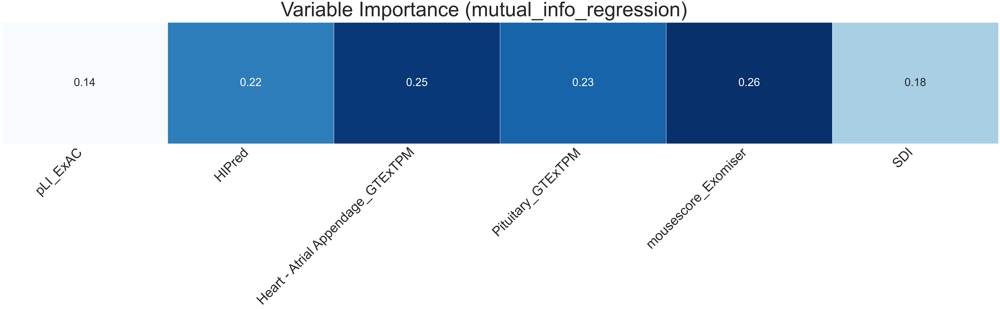

In [32]:
mutual_information = mutual_info_regression(X2, Y)

plt.subplots(1, figsize=(80, 10))
sns.heatmap(
    mutual_information[:, np.newaxis].T,
    cmap="Blues",
    cbar=False,
    linewidths=1,
    annot=True,
    annot_kws={"fontsize": 50},
)
plt.yticks([], [])
plt.gca().set_xticklabels(X2.columns, rotation=45, ha="right", fontsize=60)
plt.suptitle("Variable Importance (mutual_info_regression)", fontsize=90, y=1.01)
plt.gcf().subplots_adjust(wspace=0.2)
pass

Feature 0: 0.160199
Feature 1: 0.258450
Feature 2: 0.266983
Feature 3: 0.242554
Feature 4: 0.241847


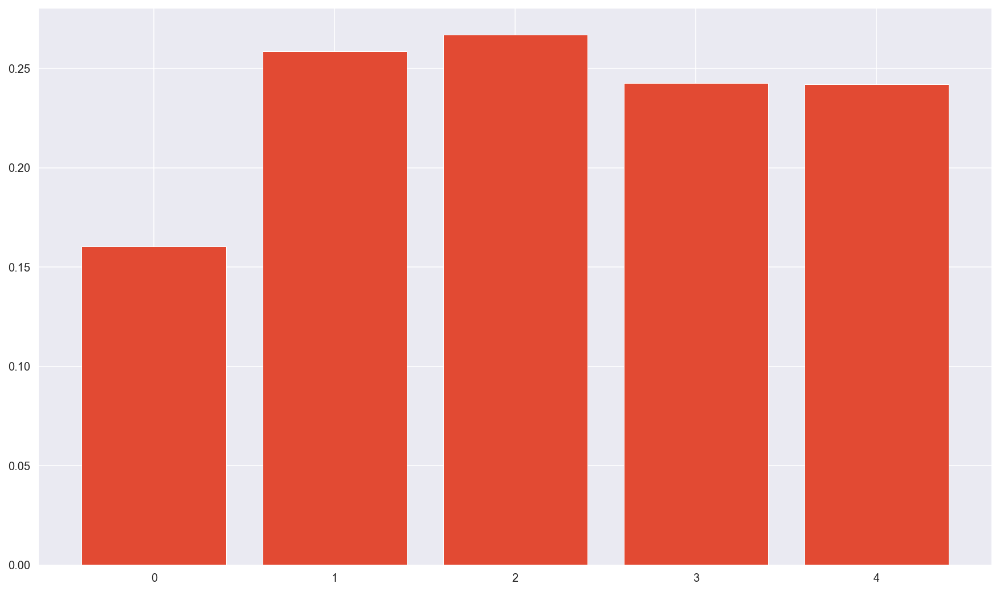

In [11]:
X=X2
# feature selection
def select_features(X_train, y_train, X_test):
    # configure to select all features
    fs = SelectKBest(score_func=mutual_info_regression, k="all")
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs


# load the dataset
# split into train and test sets
X3 = X.iloc[:, 0:5]
X_train, X_test, y_train, y_test = train_test_split(
    X3, Y, test_size=0.2, random_state=1
)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
    print("Feature %d: %f" % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

### Selected Features Covariance and Correlation:

Text(0.5, 1.0, 'Covariance between different features')

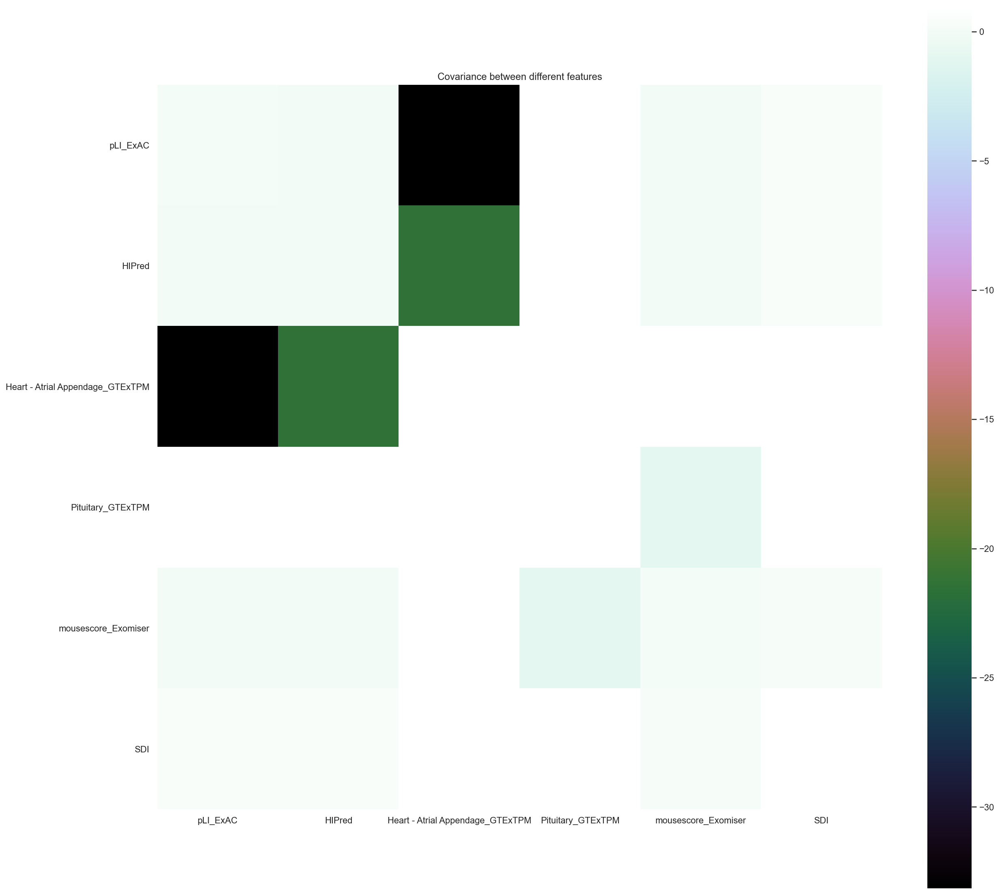

In [12]:
mean_vec = np.mean(X2, axis=0)
cov_mat = (X2 - mean_vec).T.dot((X2 - mean_vec)) / (X2.shape[0] - 1)
# print('Covariance matrix \n%s' %cov_mat)
sns.set(font_scale=1)
plt.figure(figsize=(20, 20))
sns.heatmap(cov_mat, vmax=1, square=True, cmap="cubehelix")

plt.title("Covariance between different features")

BPlabel_encoded        1.000000
Others                 1.000000
Sideeffectseverity     0.755132
SideeffectFreq         0.610985
Rank                   0.456689
                         ...   
MCAP.max                    NaN
fishscore_Exomiser          NaN
MGI_Gene                    NaN
Ratmodel_Gene               NaN
GTEx_signif_sexbias         NaN
Name: BPlabel_encoded, Length: 118, dtype: float64


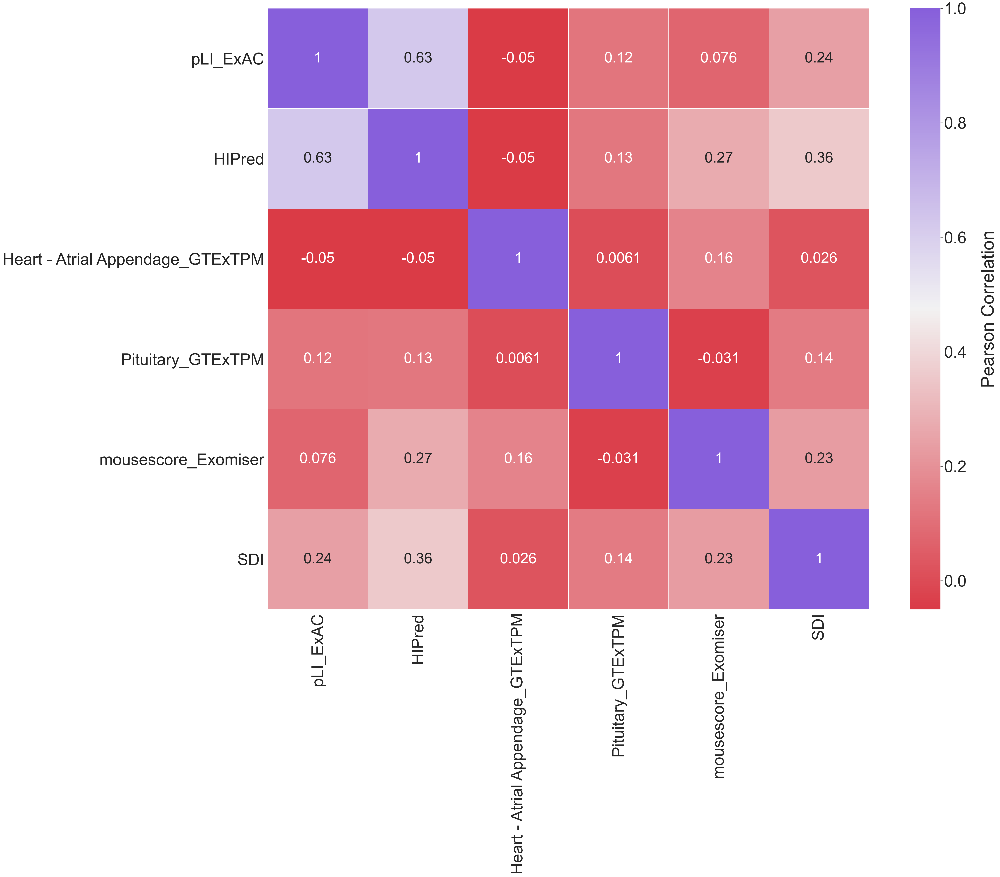

In [35]:
Xcor = X2
# Xcor.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in df1.columns.values]
Xcor = pd.DataFrame(data=Xcor, columns=X2.columns)
# Xcor.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

corr = Xcor.corr(method="pearson")

f, ax = plt.subplots(figsize=(40, 30))

# heatmap colours
cmap = sns.diverging_palette(10, 275, as_cmap=True)
sns.set(font_scale=4)
# heatmap plot of feature correlation
sns.heatmap(
    corr,
    cmap=cmap,
    square=True,
    xticklabels=True,
    yticklabels=True,
    linewidths=0.5,
    annot_kws={"size": 40},
    annot=True,
    ax=ax,
   # cbar_kws={'label': 'Pearson Correlation'}
)  # cbar_kws={"shrink": .5},

cbar = ax.collections[0].colorbar
cbar.set_label('Pearson Correlation', labelpad=40)
corr_matrix = data.corr()
print(corr_matrix["BPlabel_encoded"].sort_values(ascending=False))
corr = corr_matrix["BPlabel_encoded"].sort_values(ascending=False)

### Partial Dependence Plots

The y axis is interpreted as change in the prediction from what it would be predicted at the baseline or leftmost value.
A blue shaded area indicates level of confidence

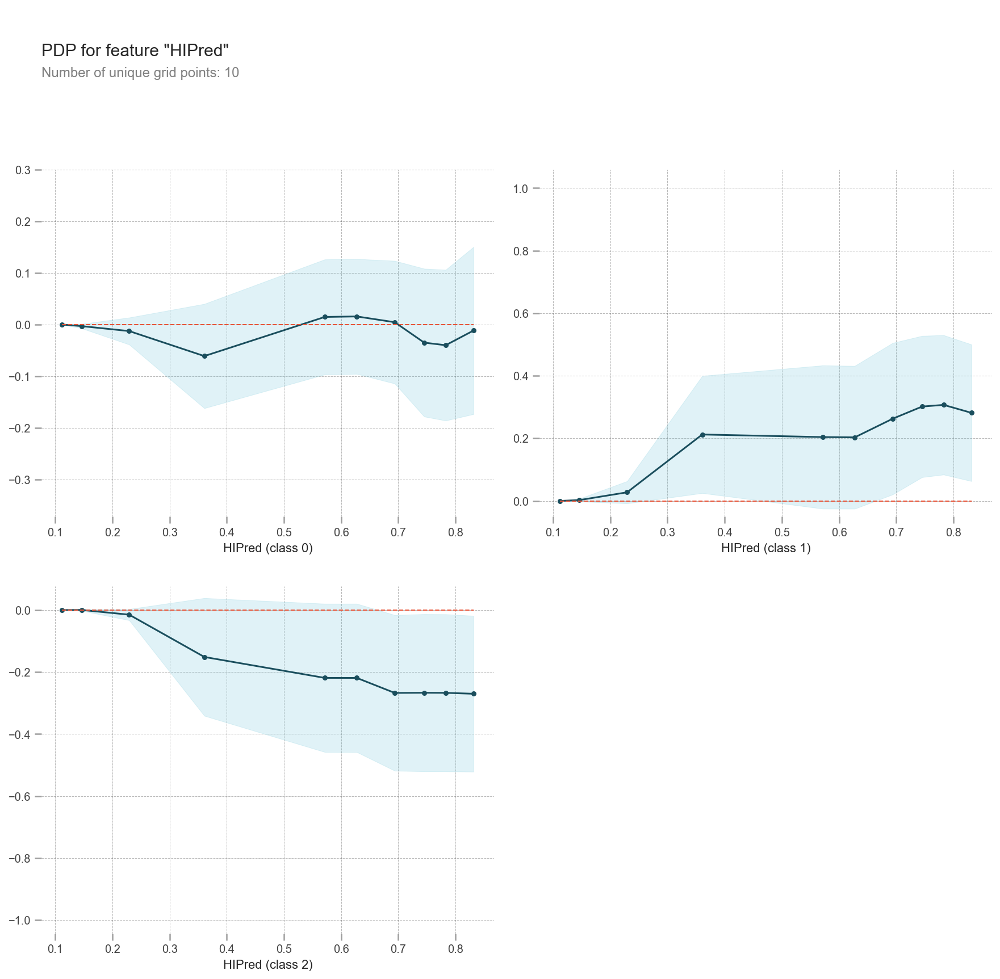

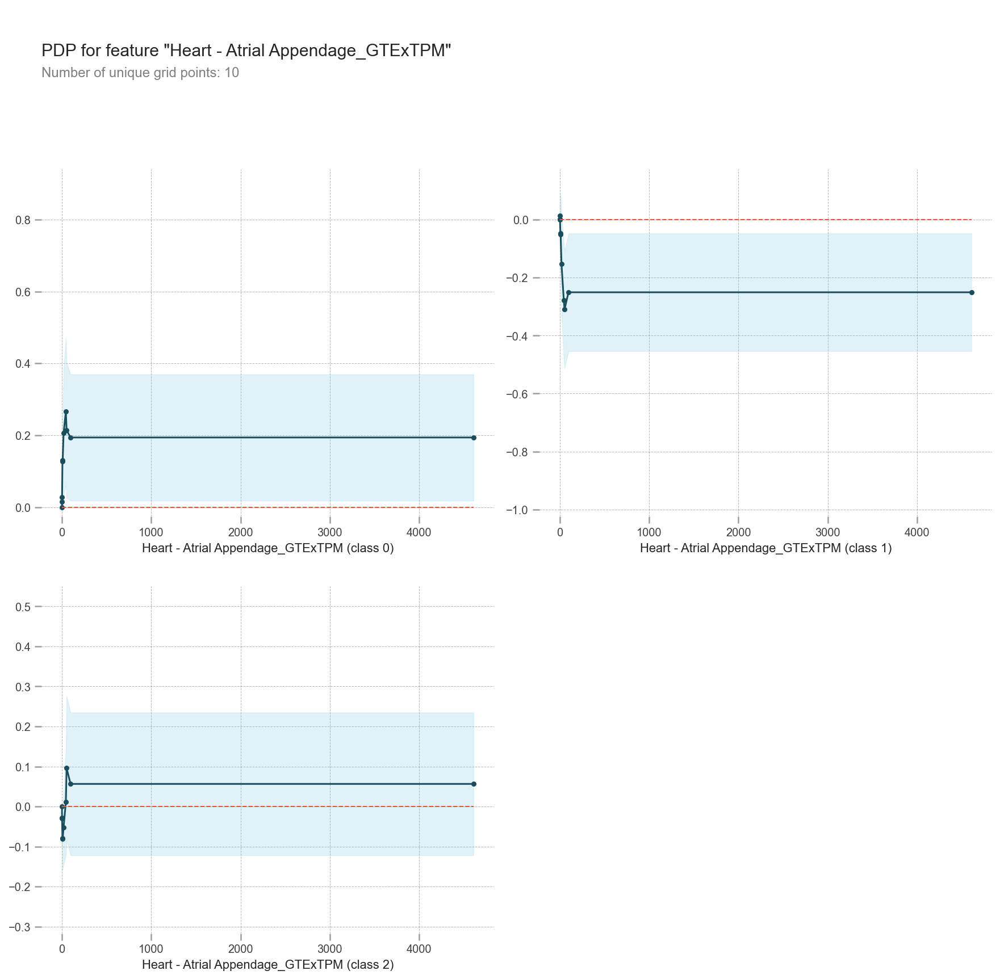

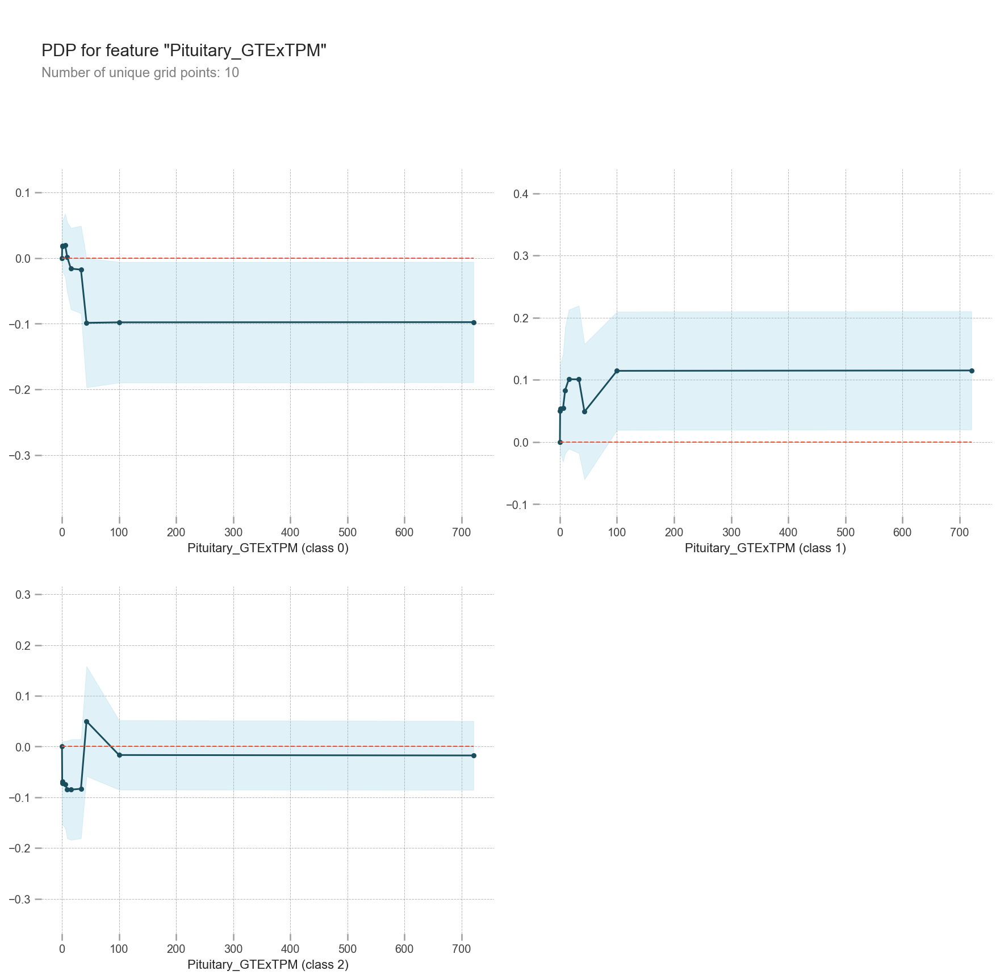

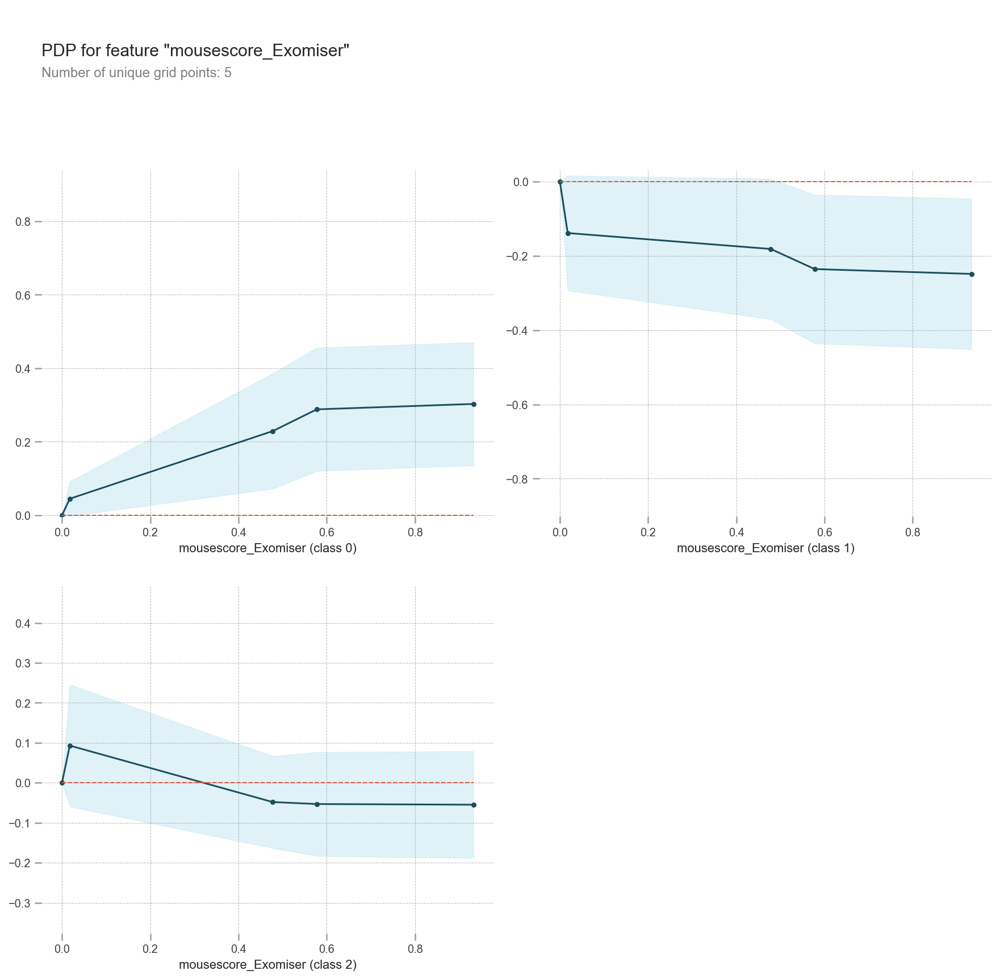

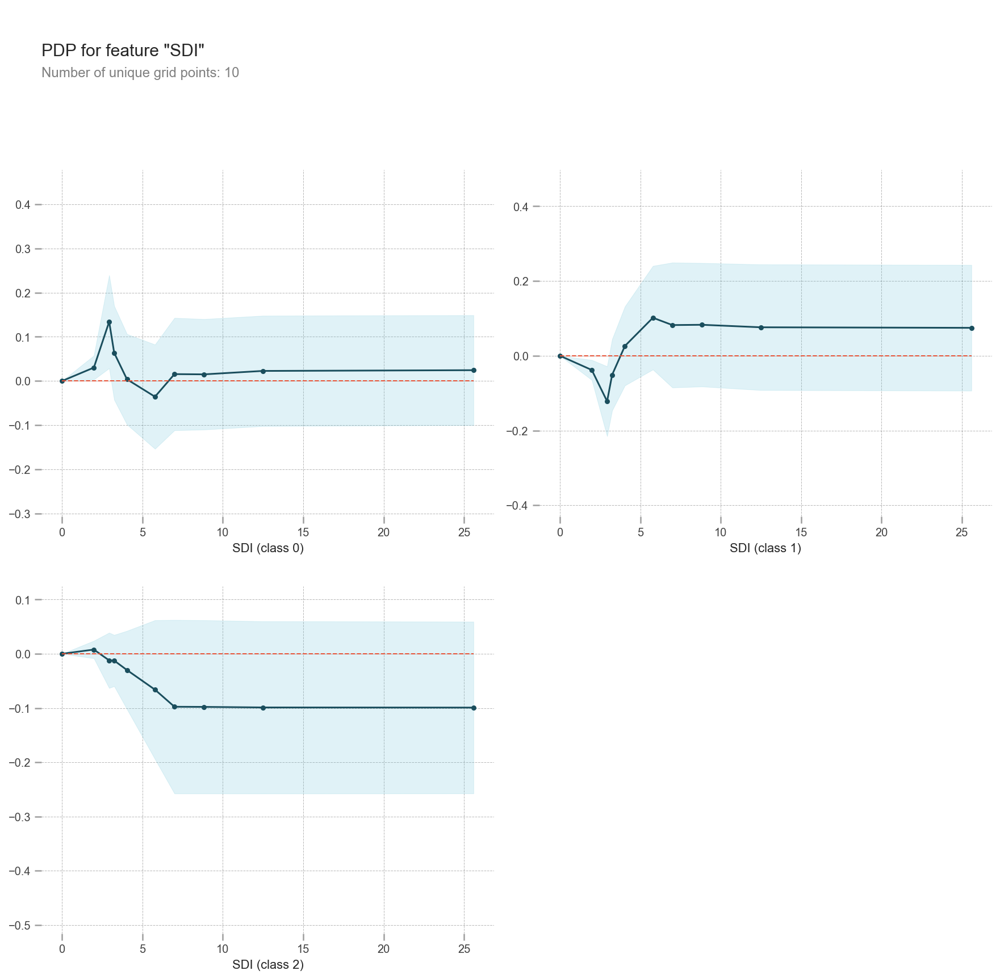

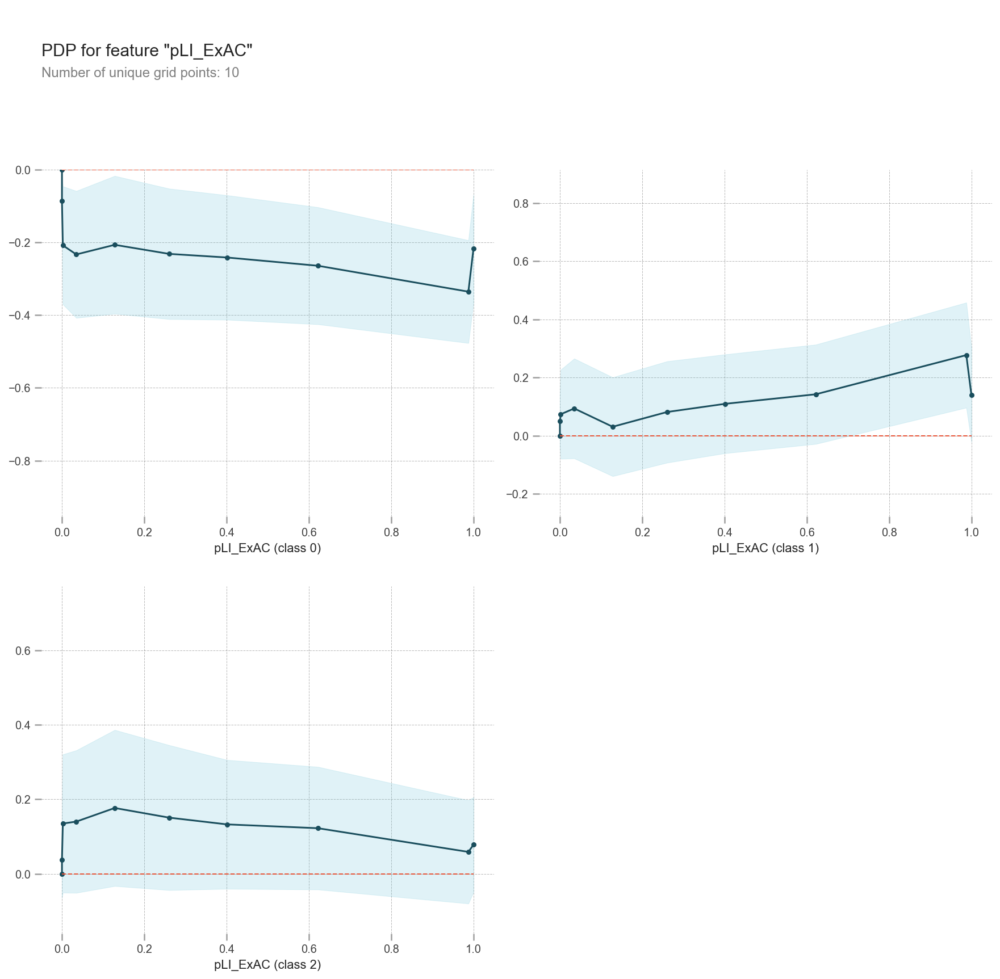

In [23]:
seed = 0
train_X, val_X, train_y, val_y = train_test_split(X2, Y, random_state=1)
tree_model = xgboost.XGBClassifier(
    n_estimators=50,
    learning_rate= 0.2,
    max_depth=4,
    reg_alpha=1,
    reg_lambda=10,
    random_state=seed,
    eval_metric='mlogloss'
).fit(train_X, train_y)


#'HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC'


feature_to_plot = "HIPred"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "Heart - Atrial Appendage_GTExTPM"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "Pituitary_GTExTPM"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "mousescore_Exomiser"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "SDI"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)
pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

feature_to_plot = "pLI_ExAC"
pdp_dist = pdp.pdp_isolate(
    model=tree_model, dataset=val_X, model_features=X2.columns, feature=feature_to_plot
)
pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

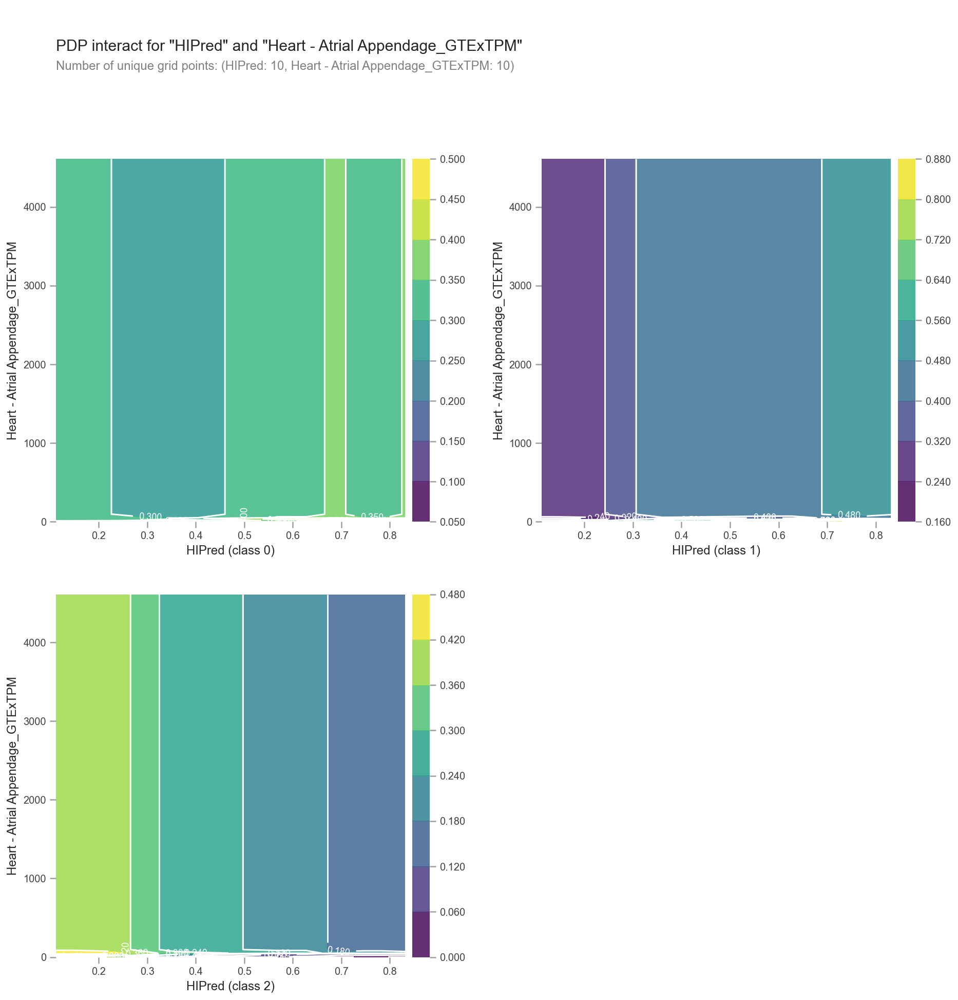

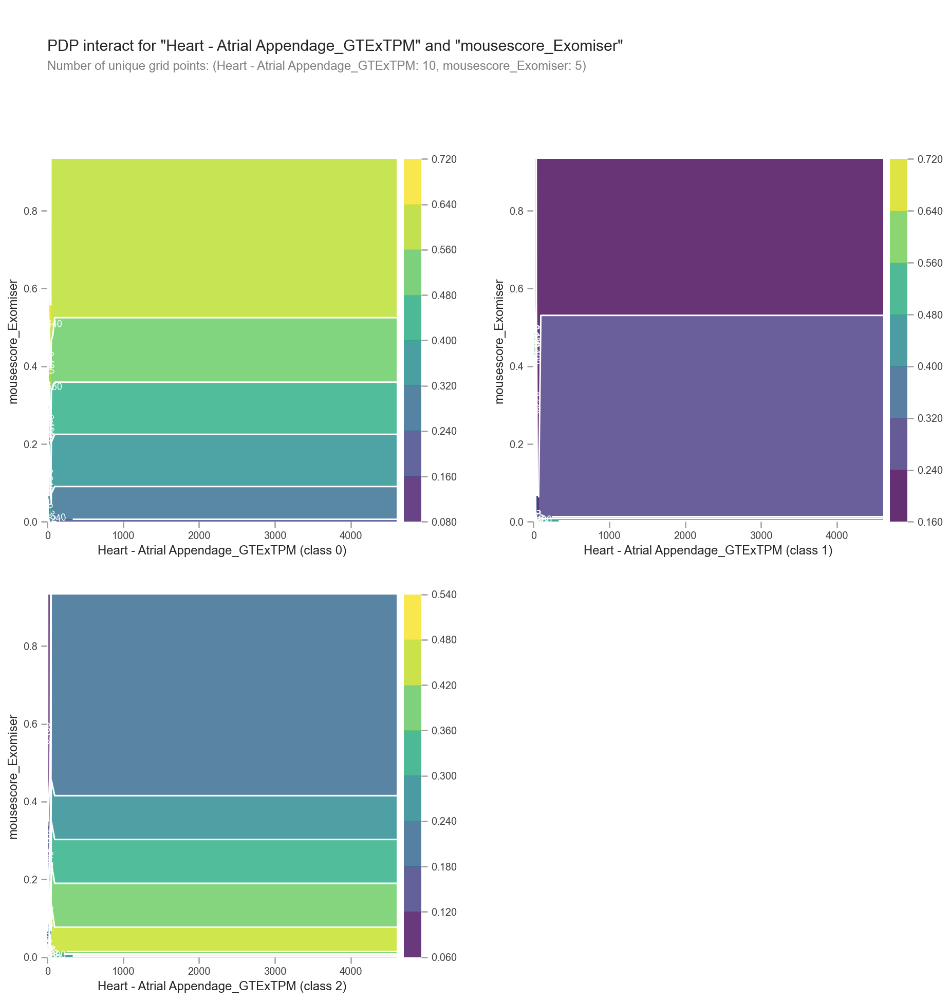

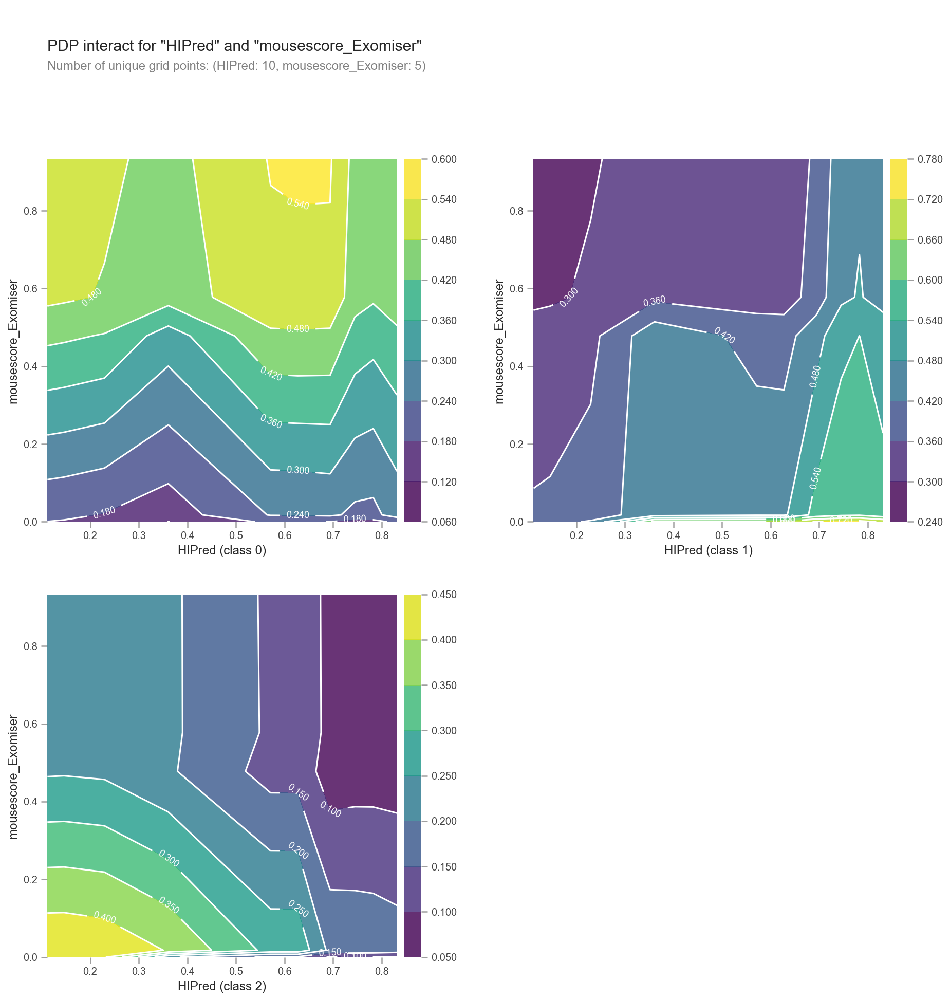

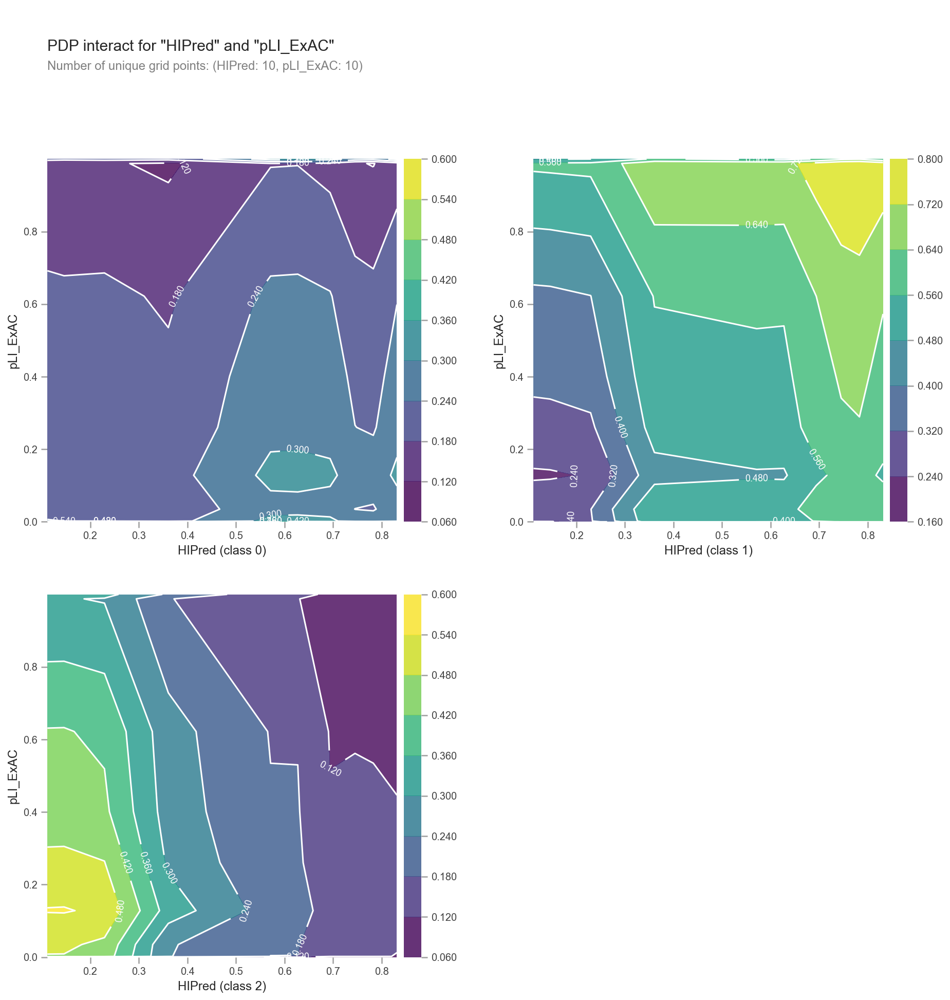

In [36]:
#['HIPred', 'Heart - Atrial Appendage_GTExTPM', 'Pituitary_GTExTPM', 'mousescore_Exomiser', 'SDI', 'pLI_ExAC']


features_to_plot = ['HIPred', 'Heart - Atrial Appendage_GTExTPM']
inter2 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter2, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ['Heart - Atrial Appendage_GTExTPM',  'mousescore_Exomiser']
inter3 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter3, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ['HIPred',  'mousescore_Exomiser']
inter3 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter3, feature_names=features_to_plot, plot_type="contour"
)
plt.show()


features_to_plot = ['HIPred',  'pLI_ExAC']
inter3 = pdp.pdp_interact(
    model=tree_model,
    dataset=val_X,
    model_features=X2.columns,
    features=features_to_plot,
)
pdp.pdp_interact_plot(
    pdp_interact_out=inter3, feature_names=features_to_plot, plot_type="contour"
)
plt.show()



### Clustering to view training data grouping:

#### PCA Explained Variance 
- for deciding n components in hierarchal clustering

In [53]:
mean_vec = np.mean(X2, axis=0)
cov_mat = (X2 - mean_vec).T.dot((X2 - mean_vec)) / (X2.shape[0] - 1)

In [54]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print("Eigenvectors \n%s" % eig_vecs)
print("\nEigenvalues \n%s" % eig_vals)


# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:, i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print("Eigenvalues in descending order:")
for i in eig_pairs:
    print(i[0])

Eigenvectors 
[[-8.85643184e-05  1.84443986e-04 -1.46177990e-01  3.65341848e-01
   6.14108710e-01  6.84085479e-01  5.75770021e-03  4.65682969e-03]
 [-9.78185683e-01 -2.07731842e-01  4.89030329e-04  4.74222310e-05
  -5.79555767e-05  6.10687749e-05 -6.00779789e-05  7.21277447e-07]
 [-2.07731814e-01  9.78185697e-01  3.38121566e-05  2.56583971e-04
  -2.42369291e-04 -2.04634097e-04 -2.26504396e-07  2.60530725e-04]
 [-4.34612153e-05  2.66414146e-04  3.48193032e-03 -4.11108994e-02
   3.74367321e-02 -2.10812495e-03 -2.67462516e-01 -9.61954025e-01]
 [-8.34443224e-05  6.67635352e-05 -1.39318281e-02 -3.75274629e-02
   1.56622655e-02 -3.29334454e-03  9.63114765e-01 -2.65615097e-01]
 [-1.79417824e-04 -2.35757398e-04 -3.98078290e-01  5.74856162e-01
   2.90662472e-01 -6.52945905e-01  5.59376030e-03 -1.48210475e-02]
 [-1.27712185e-04 -2.02847990e-04 -5.01540240e-01  3.77411643e-01
  -7.05697975e-01  3.25049041e-01  6.79751755e-03 -4.80110886e-02]
 [-4.45601066e-04  1.32782927e-04 -7.53934081e-01 -6.24

In [55]:
tot = sum(eig_vals)
var_exp = [(i / tot) * 100 for i in sorted(eig_vals, reverse=True)]
len(var_exp)

8

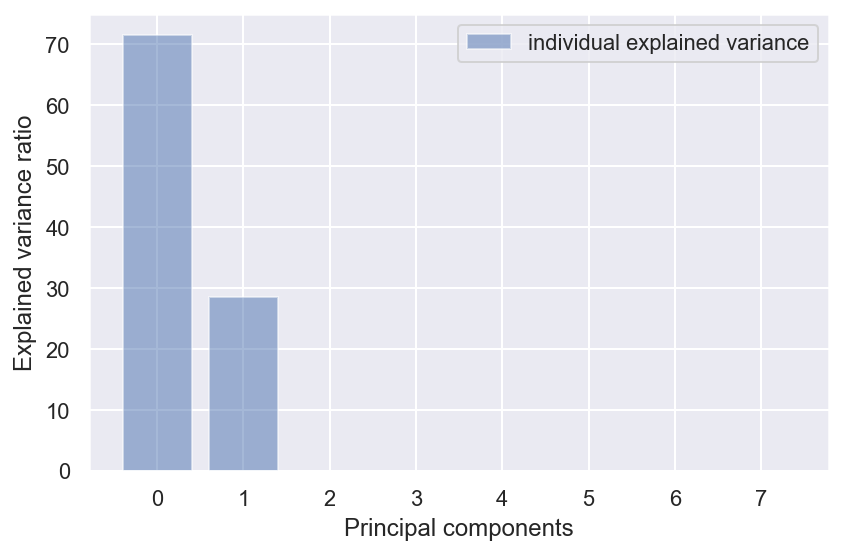

In [56]:
sns.set(font_scale=1)
plt.figure(figsize=(6, 4))

plt.bar(
    range(8), var_exp, alpha=0.5, align="center", label="individual explained variance"
)
plt.ylabel("Explained variance ratio")
plt.xlabel("Principal components")
plt.legend(loc="best")
plt.tight_layout()

Text(0, 0.5, 'Cumulative explained variance')

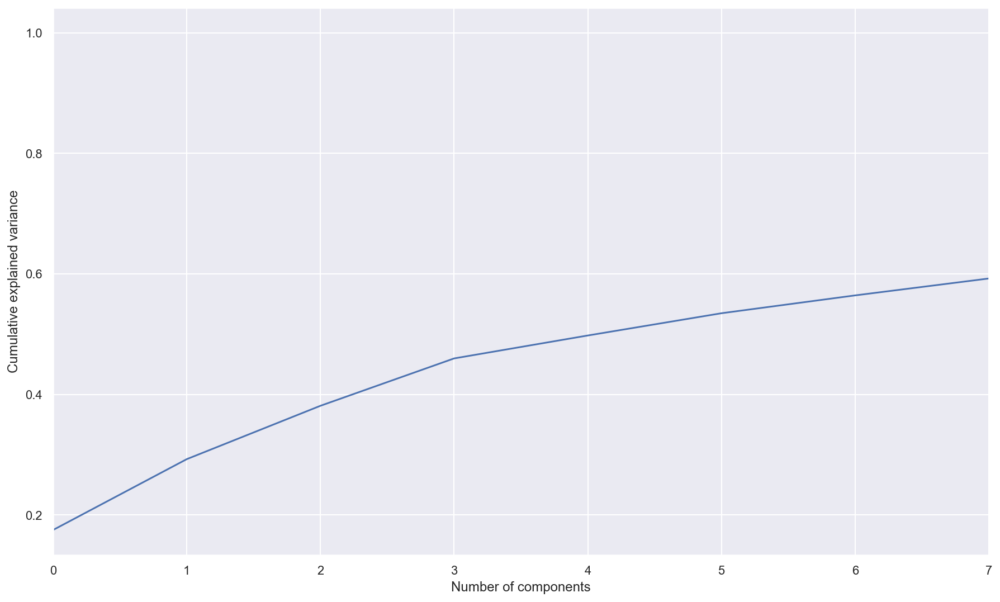

In [57]:
from sklearn.decomposition import PCA

pca = PCA().fit(X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0, 7, 1)
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

## Hierarchal Clustering

### All training data:

In [58]:
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop("max_d", None)
    if max_d and "color_threshold" not in kwargs:
        kwargs["color_threshold"] = max_d
    annotate_above = kwargs.pop("annotate_above", 0)
    plt.figure(figsize=(15, 10))
    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get("no_plot", False):
        plt.title("Hierarchical Clustering Dendrogram (truncated)")
        plt.xlabel("sample index or (cluster size)")
        plt.ylabel("distance")
        for i, d, c in zip(ddata["icoord"], ddata["dcoord"], ddata["color_list"]):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, "o", c=c)
                plt.annotate(
                    "%.3g" % y,
                    (x, y),
                    xytext=(0, -5),
                    textcoords="offset points",
                    va="top",
                    ha="center",
                )
        if max_d:
            plt.axhline(y=max_d, c="k")
    return ddata

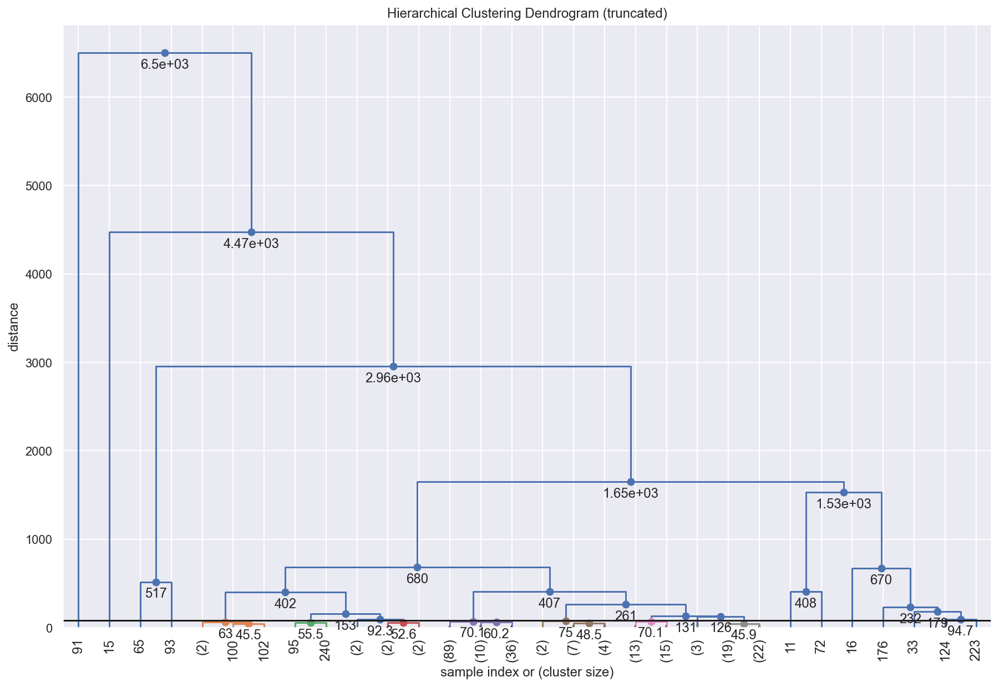

In [59]:
linked_array = ward(X2)

fancy_dendrogram(
    linked_array,
    truncate_mode="lastp",
    p=30,
    leaf_rotation=90.0,
    leaf_font_size=12.0,
    show_contracted=True,
    annotate_above=10,
    max_d=80,
)

plt.show()

In [60]:
X2.shape

(243, 8)

In [61]:
# Reducing the dimensions of the data
pca = PCA(n_components=2)
X_principal = pca.fit_transform(X)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ["P1", "P2"]

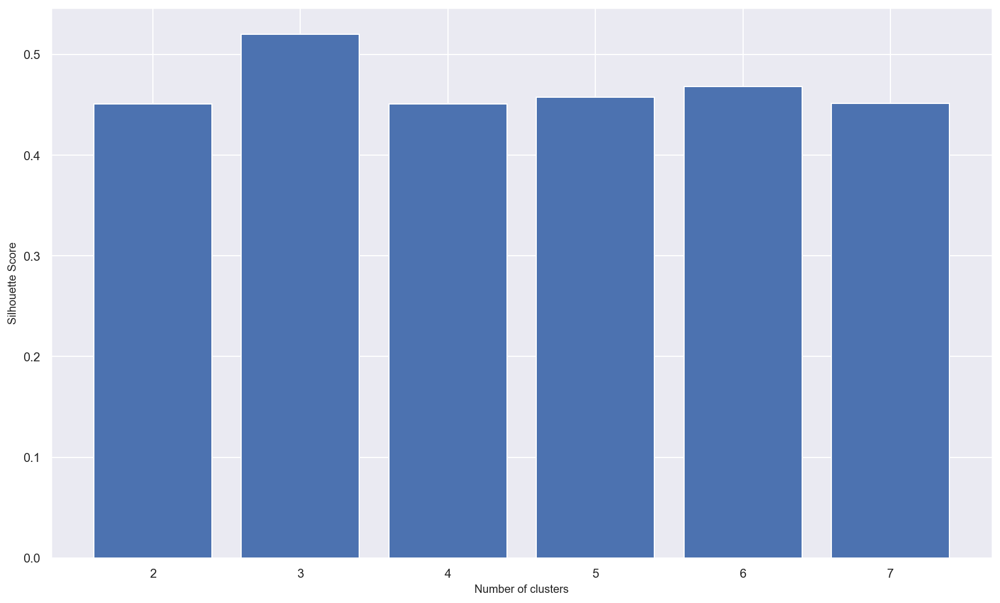

In [62]:
silhouette_scores = []

for n_cluster in range(2, 8):
    silhouette_scores.append(
        silhouette_score(
            X_principal,
            AgglomerativeClustering(n_clusters=n_cluster).fit_predict(X_principal),
        )
    )

# Plotting a bar graph to compare the results
k = [2, 3, 4, 5, 6, 7]
plt.bar(k, silhouette_scores)
plt.xlabel("Number of clusters", fontsize=10)
plt.ylabel("Silhouette Score", fontsize=10)
plt.show()

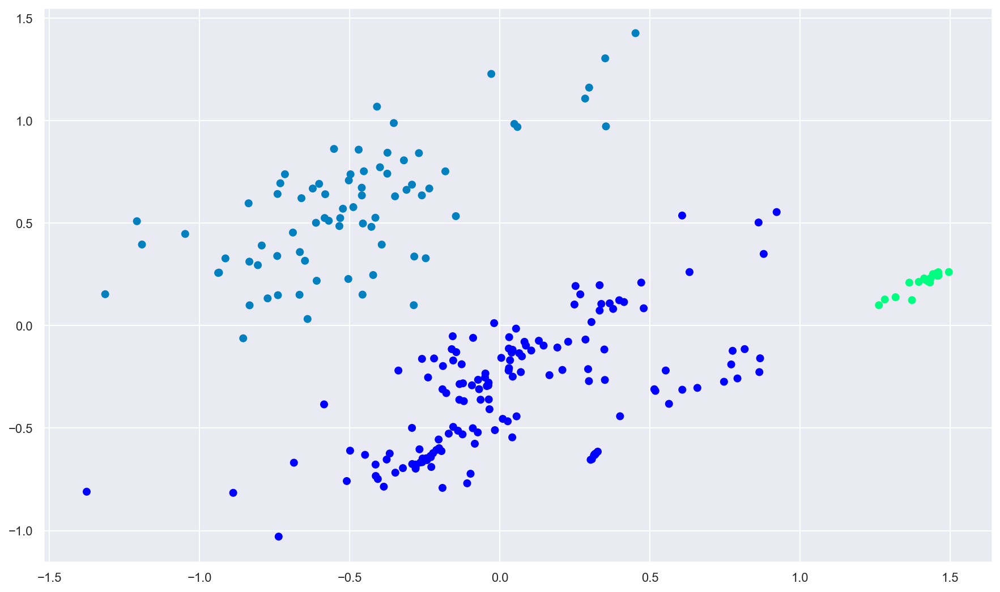

In [63]:
agg = AgglomerativeClustering(n_clusters=3)
agg.fit(X_principal)

sns.set(font_scale=1)
plt.scatter(
    X_principal["P1"],
    X_principal["P2"],
    c=AgglomerativeClustering(n_clusters=3).fit_predict(X_principal),
    cmap=plt.cm.winter,
)
plt.show()

### Elbow and silhouette scores - no PCA

Text(0, 0.5, 'Total within-cluster sum of squares')

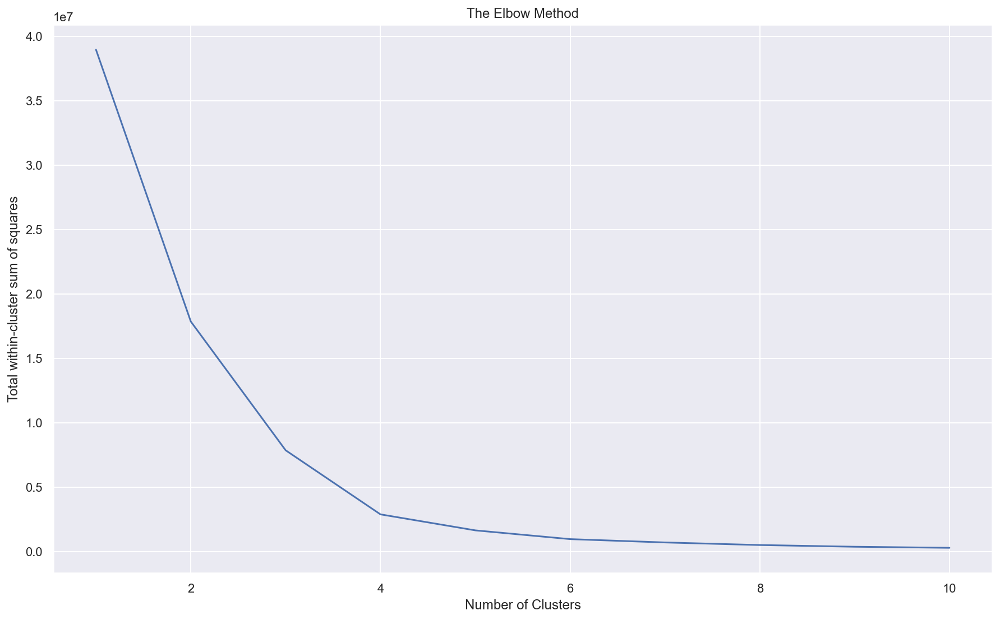

In [64]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

twss = []
sa = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init="k-means++")
    kmeans.fit(X2)
    Ypreds = kmeans.predict(X2)
    twss.append(kmeans.inertia_)
    if i > 1:
        sa.append(silhouette_score(X2, Ypreds))


plt.plot(range(1, 11), twss)
plt.title("The Elbow Method")
plt.xlabel("Number of Clusters")
plt.ylabel("Total within-cluster sum of squares")

Text(0, 0.5, 'Average silhouette score')

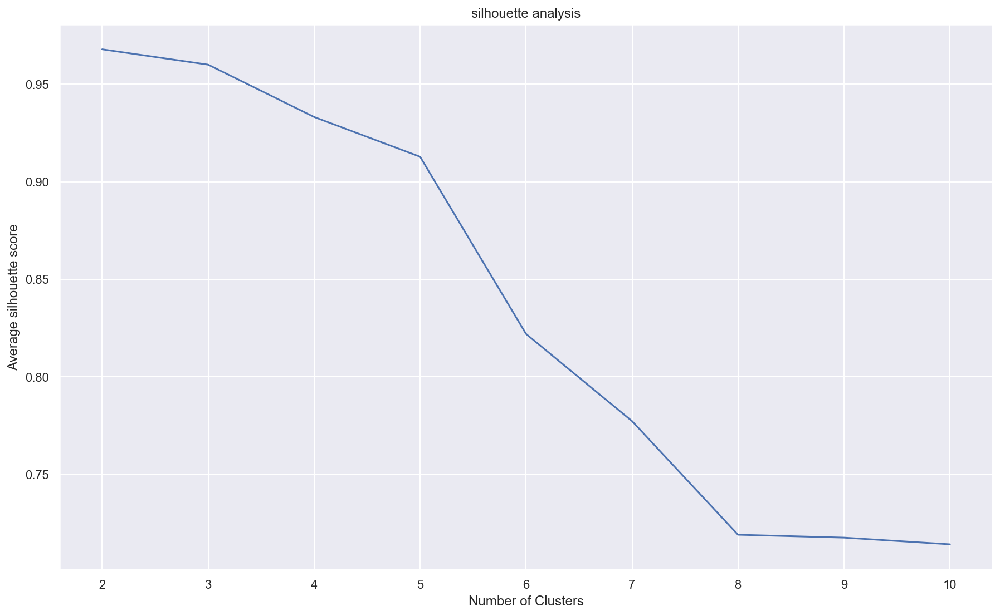

In [65]:
plt.plot(range(2, 11), sa)
plt.title("silhouette analysis")
plt.xlabel("Number of Clusters")
plt.ylabel("Average silhouette score")